# Unsupervised Learning: clustering countries on the basis of demographic data

## Introduction

This notebook presents a comprehensive workflow for exploring and clustering a global country‐level dataset using unsupervised learning techniques. 

We begin with Exploratory Data Analysis (EDA) to uncover patterns, relationships, and potential data quality issues. Building on those insights, we engineer and preprocess features to prepare the data for a variety of clustering algorithms. 

Finally, we compare and evaluate different clustering approaches to determine which method best captures meaningful groupings of countries.

### Research Question

> **Can unsupervised clustering techniques uncover meaningful segments among countries based on socio‐economic and demographic indicators, and which algorithm produces the most coherent and interpretable groupings?**  

### Key Sections

1. **Data Preparation & EDA**  
   - **Importing Required Libraries:** Load all Python packages needed for analysis and visualization.  
   - **Loading the Dataset:** Read in the `Country-data.csv` file and inspect its dimensions.  
   - **Understanding the Data Structure:** Examine variable types, missing values, and basic summary statistics.  
   - **Univariate and Bivariate Exploration:** Visualize individual feature distributions and pairwise relationships.  
   - **Correlation Analysis:** Identify clusters of highly correlated indicators.  
   - **Interactive Visualizations:** Use widgets and interactive plots to drill into the data.  
   - **Feature Engineering:** Create or transform variables to better capture underlying patterns.  
   - **Scaling & Dimensionality Reduction:** Standardize features and apply techniques like PCA or t-SNE for visualization.

2. **Unsupervised Learning Analysis**  
   - **K-Means Clustering:** Fit basic K-Means and explore initial groupings.  
   - **Hyperparameter Optimization (K-Means):** Use metrics like the elbow method and silhouette scores to pick the optimal k.  
   - **Hierarchical Clustering:** Build dendrograms and cut at different levels to form clusters.  
   - **DBSCAN:** Detect clusters based on density and identify noise points.  
   - **Gaussian Mixture Models (GMM):** Model clusters as probabilistic distributions.  
   - **Model Comparison & Evaluation:** Compute the Adjusted Rand Index (ARI) and other metrics to compare methods.  
   - **Cluster Interpretation & Visualization:** Map and describe the final country groupings.


## Part 1: Data Preparation & EDA

### Importing Required Libraries

In [1]:
# Data manipulation libraries
import pandas as pd
import numpy as np

# Data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set visualization styles
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# For displaying all columns
pd.set_option('display.max_columns', None)

# For reproducibility 
np.random.seed(42)

# Configure matplotlib for better visualization in Jupyter
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

### Loading the Dataset

In [2]:
# Load the dataset
df = pd.read_csv('Country-data.csv')

# Initial overview of the data
print(f"Shape of the dataset: {df.shape}")
print("\nFirst 5 rows of the dataset:")
df.head()

Shape of the dataset: (167, 10)

First 5 rows of the dataset:


,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


## Understanding the Data Structure

In [3]:
# Check the data types of each column
print("Data Types:")
print(df.dtypes)

# Basic statistics of numerical columns
print("\nStatistical Summary:")
df.describe().T

Data Types:
country        object
child_mort    float64
exports       float64
health        float64
imports       float64
income          int64
inflation     float64
life_expec    float64
total_fer     float64
gdpp            int64
dtype: object

Statistical Summary:


,count,mean,std,min,25%,50%,75%,max
child_mort,167.0,38.270060,40.328931,2.6000,8.250,19.30,62.10,208.00
exports,167.0,41.108976,27.412010,0.1090,23.800,35.00,51.35,200.00
health,167.0,6.815689,2.746837,1.8100,4.920,6.32,8.60,17.90
imports,167.0,46.890215,24.209589,0.0659,30.200,43.30,58.75,174.00
income,167.0,17144.688623,19278.067698,609.0000,3355.000,9960.00,22800.00,125000.00
inflation,167.0,7.781832,10.570704,-4.2100,1.810,5.39,10.75,104.00
life_expec,167.0,70.555689,8.893172,32.1000,65.300,73.10,76.80,82.80
total_fer,167.0,2.947964,1.513848,1.1500,1.795,2.41,3.88,7.49
gdpp,167.0,12964.155689,18328.704809,231.0000,1330.000,4660.00,14050.00,105000.00


In [4]:
# Check for missing values
print("Missing Values:")
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100
missing_df = pd.DataFrame({
    'Missing Count': missing_values,
    'Missing Percentage': missing_percentage
})
missing_df

Missing Values:


,Missing Count,Missing Percentage
country,0,0.0
child_mort,0,0.0
exports,0,0.0
health,0,0.0
imports,0,0.0
income,0,0.0
inflation,0,0.0
life_expec,0,0.0
total_fer,0,0.0
gdpp,0,0.0


In [5]:
# Check for duplicates
print(f"Number of duplicate rows: {df.duplicated().sum()}")

# Check for unique countries
print(f"Number of unique countries: {df['country'].nunique()}")

Number of duplicate rows: 0
Number of unique countries: 167


Helpfully, with this dataset there are no missing values, and the data is provided in a relatively "clean" format. Onwards!

## Exploring Individual Features

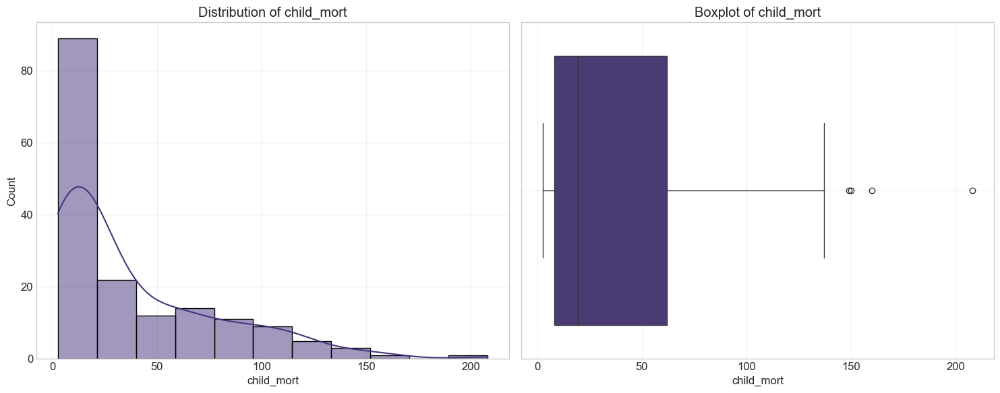

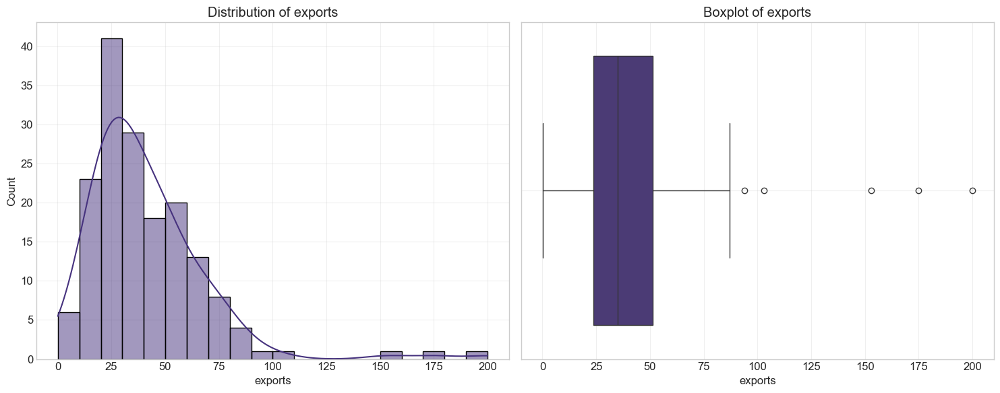

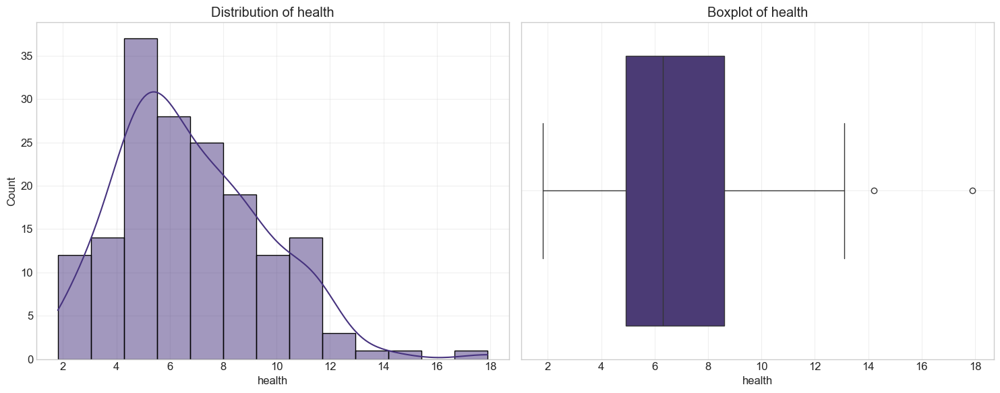

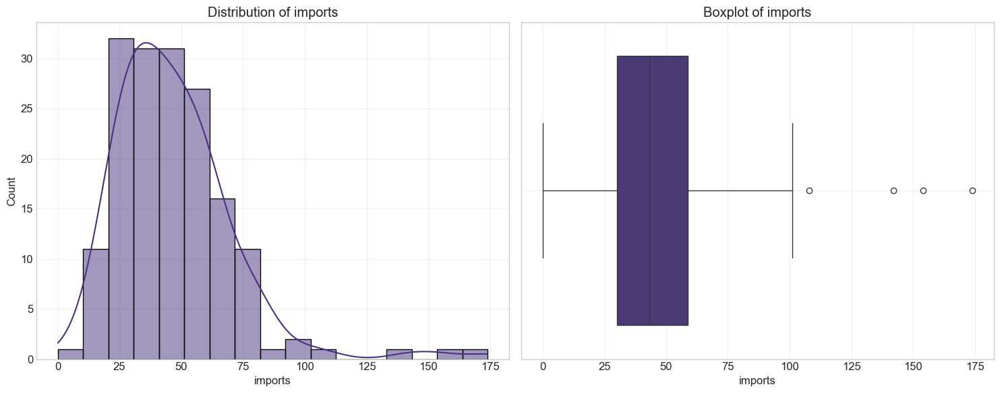

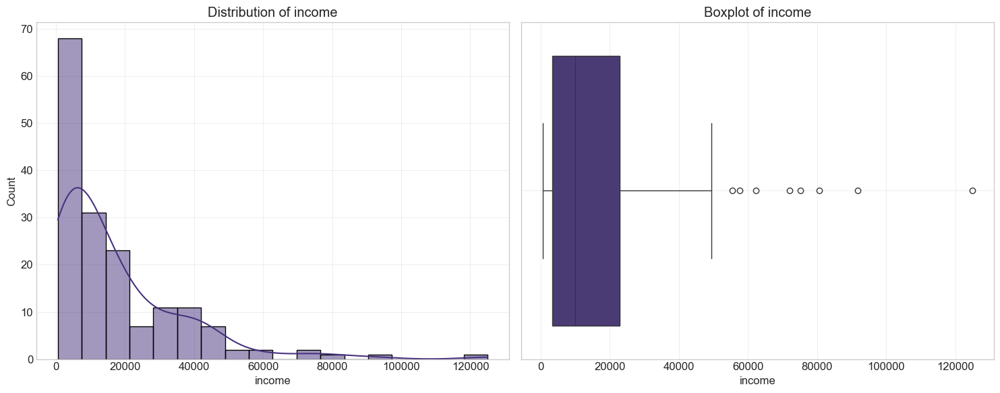

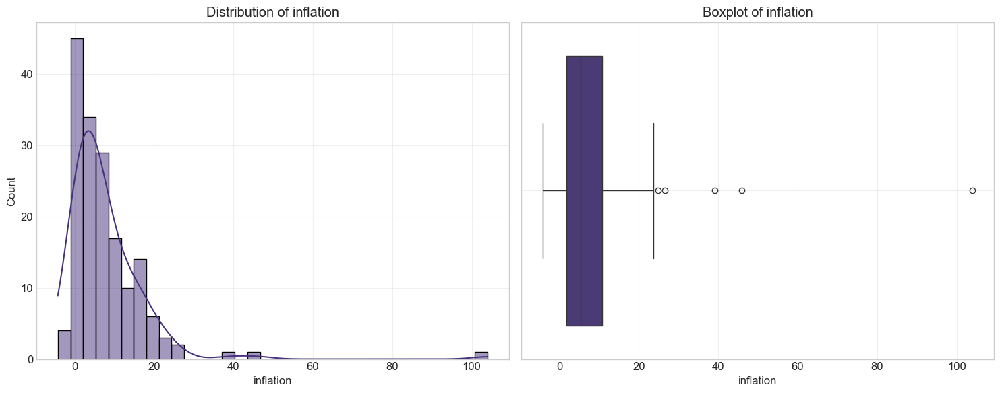

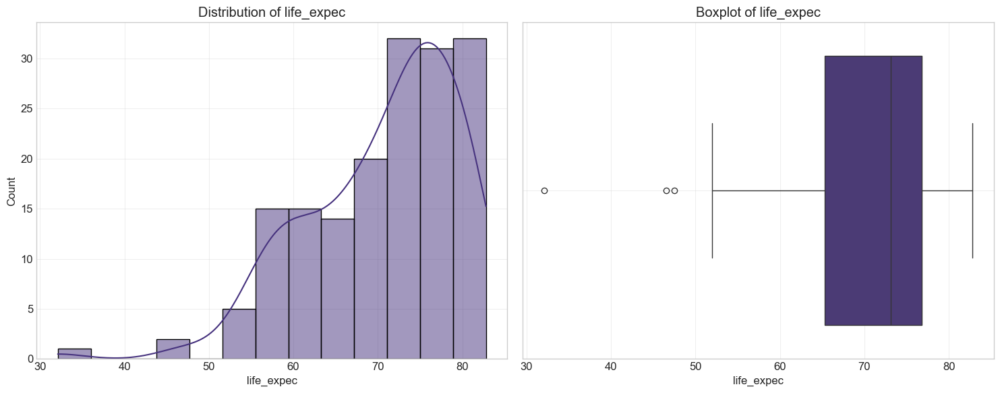

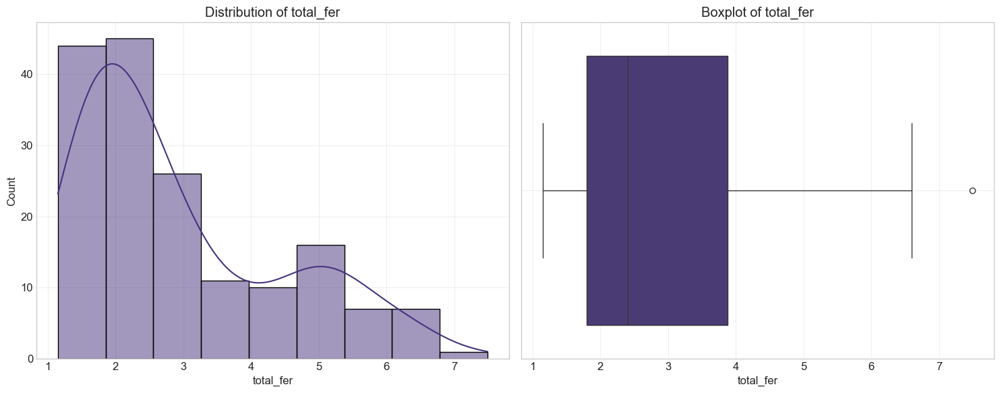

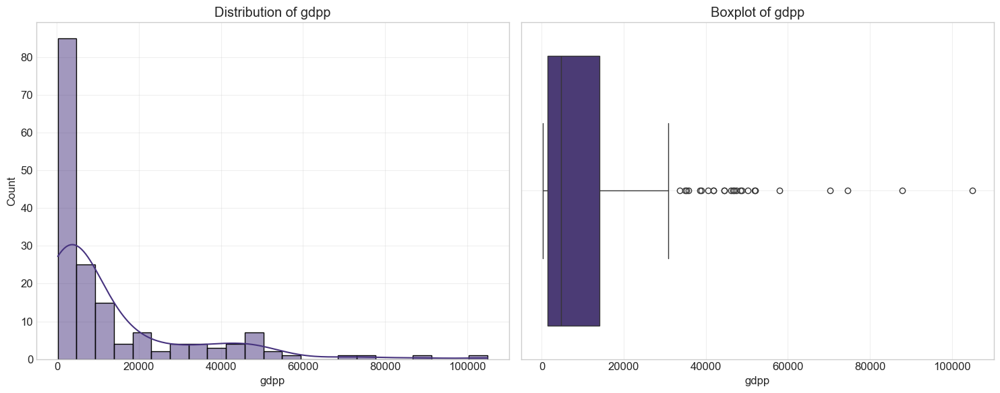

In [6]:
# Create a function to plot distribution of numerical features
def plot_distribution(df, column):
    plt.figure(figsize=(15, 6))
    
    # Create subplot for histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.grid(True, alpha=0.3)
    
    # Create subplot for boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# List of numerical columns
numerical_columns = ['child_mort', 'exports', 'health', 'imports', 'income', 
                     'inflation', 'life_expec', 'total_fer', 'gdpp']

# Plot distribution for each numerical feature
for column in numerical_columns:
    plot_distribution(df, column)

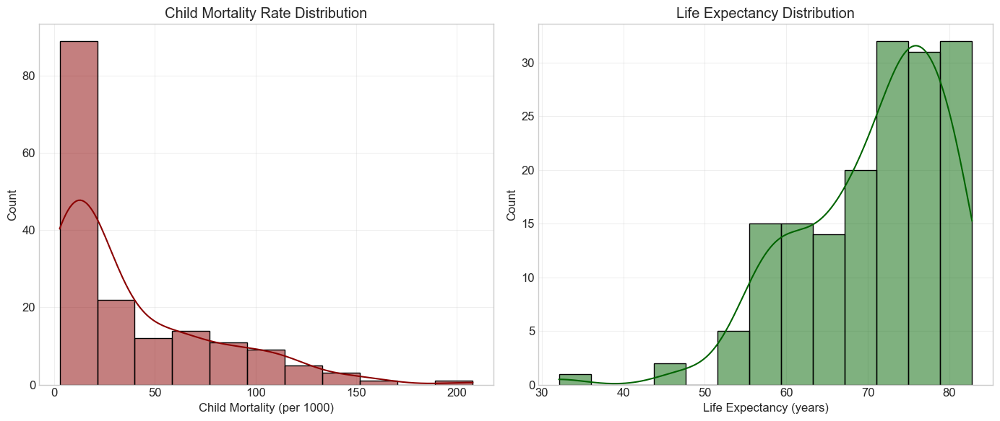

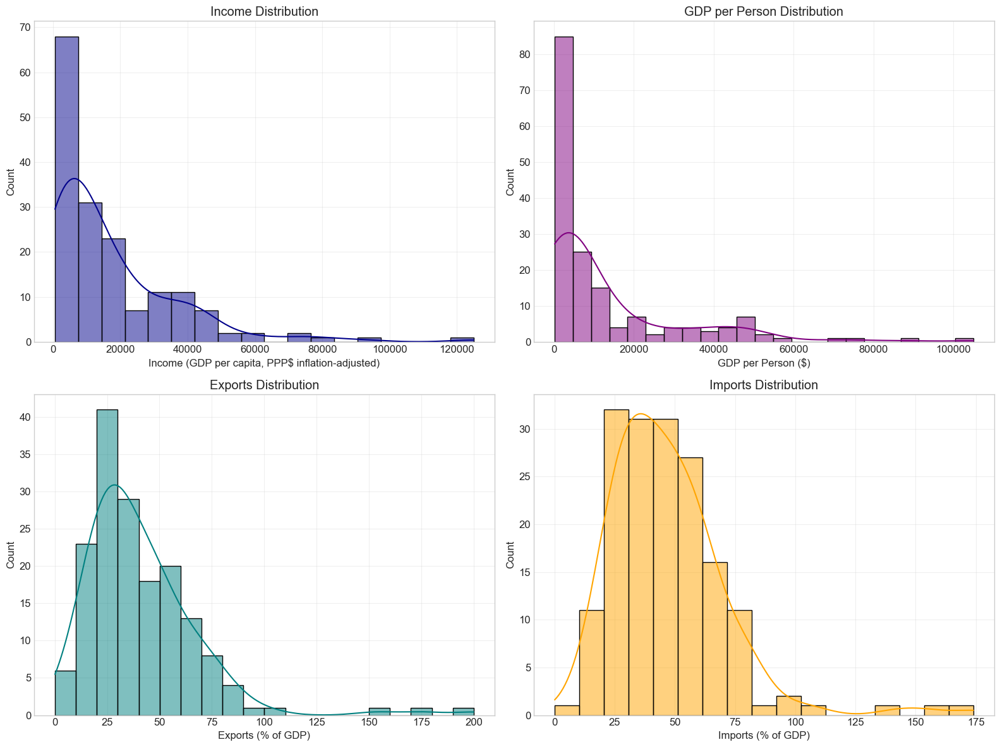

In [7]:
# Let's explore the key metrics with more context

# Child mortality and life expectancy
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['child_mort'], kde=True, color='darkred')
plt.title('Child Mortality Rate Distribution')
plt.xlabel('Child Mortality (per 1000)')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
sns.histplot(df['life_expec'], kde=True, color='darkgreen')
plt.title('Life Expectancy Distribution')
plt.xlabel('Life Expectancy (years)')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Economic indicators
plt.figure(figsize=(16, 12))
plt.subplot(2, 2, 1)
sns.histplot(df['income'], kde=True, color='darkblue')
plt.title('Income Distribution')
plt.xlabel('Income (GDP per capita, PPP$ inflation-adjusted)')
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 2)
sns.histplot(df['gdpp'], kde=True, color='purple')
plt.title('GDP per Person Distribution')
plt.xlabel('GDP per Person ($)')
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 3)
sns.histplot(df['exports'], kde=True, color='teal')
plt.title('Exports Distribution')
plt.xlabel('Exports (% of GDP)')
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 4)
sns.histplot(df['imports'], kde=True, color='orange')
plt.title('Imports Distribution')
plt.xlabel('Imports (% of GDP)')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

We have a number of non-normally distributed variables, which we'll return to later in feature engineering for consideration

In [8]:
# Function to identify outliers using IQR
def identify_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

# Check outliers for each numerical column
for column in numerical_columns:
    outliers = identify_outliers(df, column)
    print(f"\nOutliers in {column}: {len(outliers)}")
    if len(outliers) > 0:
        print(outliers[['country', column]].head(5))


Outliers in child_mort: 4
                      country  child_mort
31   Central African Republic       149.0
32                       Chad       150.0
66                      Haiti       208.0
132              Sierra Leone       160.0

Outliers in exports: 5
        country  exports
73      Ireland    103.0
91   Luxembourg    175.0
98        Malta    153.0
131  Seychelles     93.8
133   Singapore    200.0

Outliers in health: 2
                   country  health
101  Micronesia, Fed. Sts.    14.2
159          United States    17.9

Outliers in imports: 4
        country  imports
91   Luxembourg    142.0
98        Malta    154.0
131  Seychelles    108.0
133   Singapore    174.0

Outliers in income: 8
        country  income
23       Brunei   80600
82       Kuwait   75200
91   Luxembourg   91700
114      Norway   62300
123       Qatar  125000

Outliers in inflation: 5
               country  inflation
49   Equatorial Guinea       24.9
103           Mongolia       39.2
113            Ni

In [9]:
# Create a copy of the dataframe for potential transformations
df_cleaned = df.copy()

# Let's see if any column needs log transformation due to skewness
for column in numerical_columns:
    skewness = df[column].skew()
    print(f"Skewness of {column}: {skewness:.2f}")
    
    if abs(skewness) > 1:
        print(f" - High skewness detected, log transformation might be needed for {column}")

Skewness of child_mort: 1.45
 - High skewness detected, log transformation might be needed for child_mort
Skewness of exports: 2.45
 - High skewness detected, log transformation might be needed for exports
Skewness of health: 0.71
Skewness of imports: 1.91
 - High skewness detected, log transformation might be needed for imports
Skewness of income: 2.23
 - High skewness detected, log transformation might be needed for income
Skewness of inflation: 5.15
 - High skewness detected, log transformation might be needed for inflation
Skewness of life_expec: -0.97
Skewness of total_fer: 0.97
Skewness of gdpp: 2.22
 - High skewness detected, log transformation might be needed for gdpp


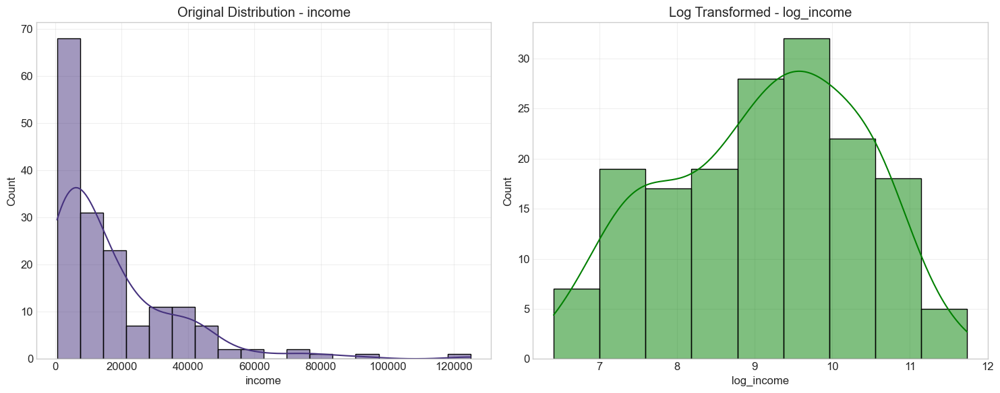

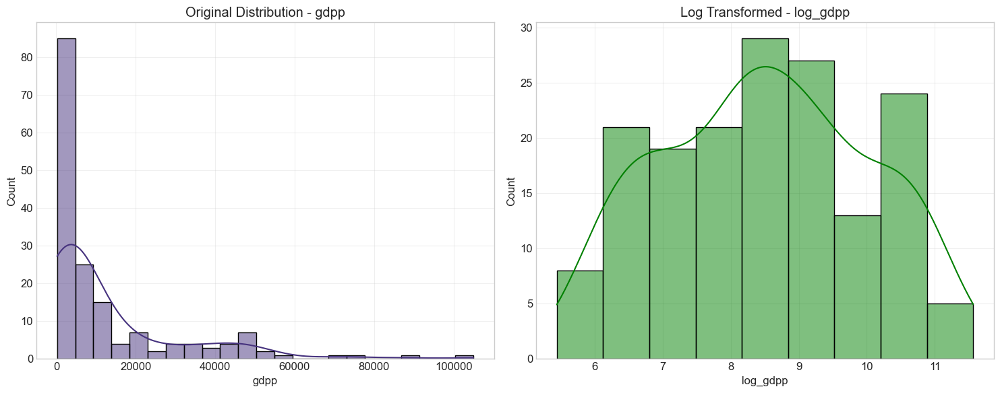

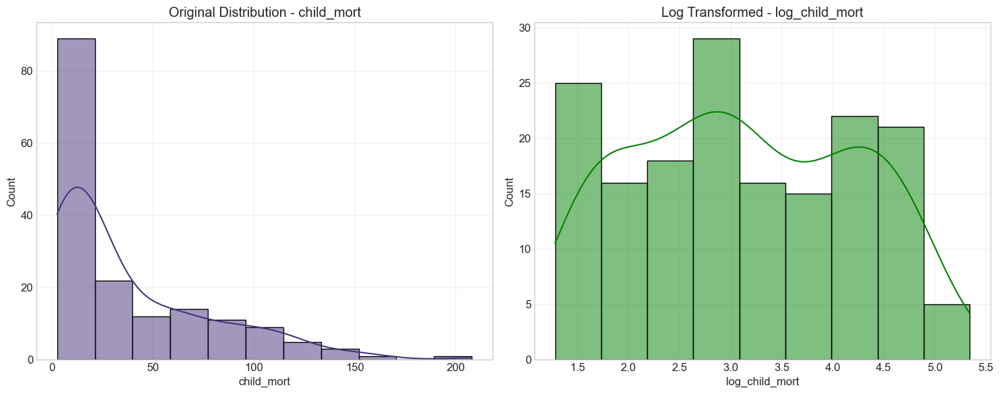

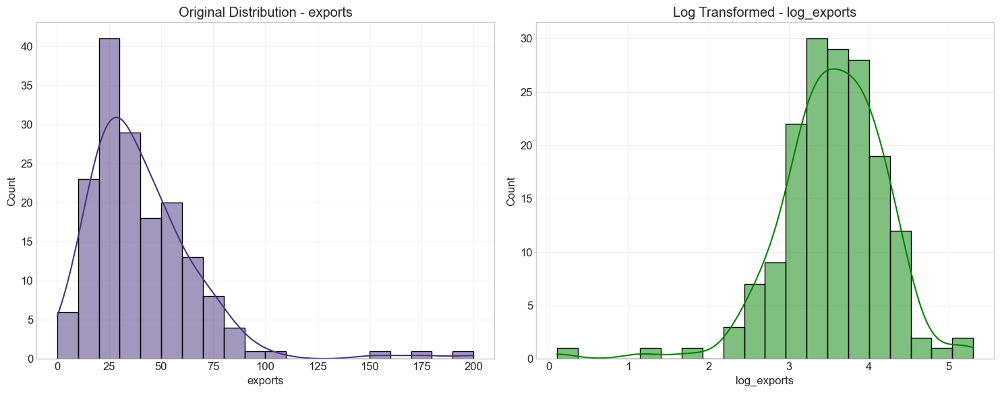

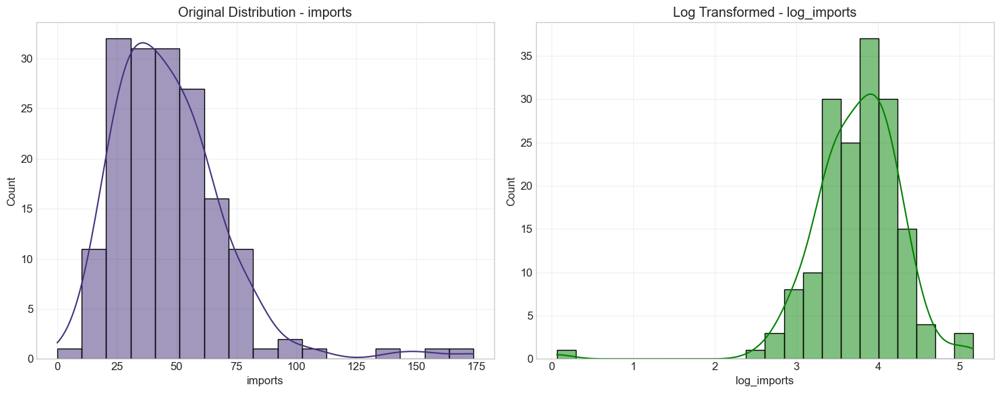

C:\Users\BobThomas\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


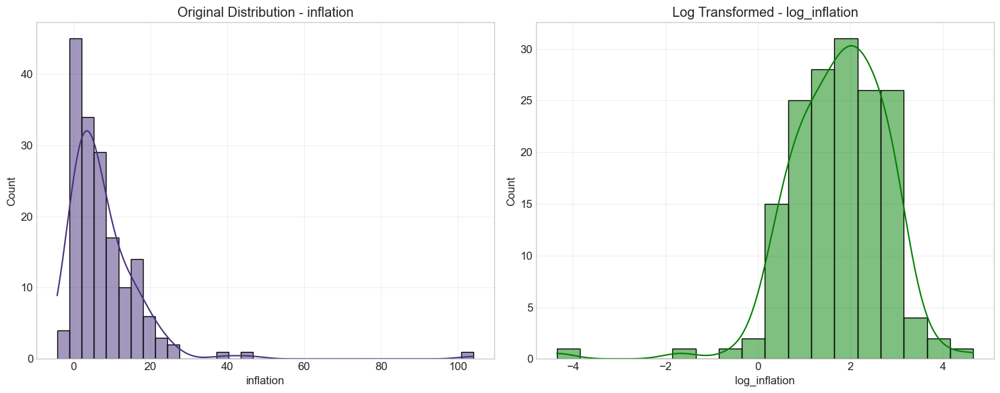

In [10]:
# Apply log transformation to highly skewed features
# Note: We'll add a small constant (1) before log transformation to handle zeros
for column in ['income', 'gdpp', 'child_mort', 'exports', 'imports', 'inflation']:
    df_cleaned[f'log_{column}'] = np.log1p(df_cleaned[column])
    
    # Plot before and after transformation
    plt.figure(figsize=(15, 6))
    
    plt.subplot(1, 2, 1)
    sns.histplot(df_cleaned[column], kde=True)
    plt.title(f'Original Distribution - {column}')
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    sns.histplot(df_cleaned[f'log_{column}'], kde=True, color='green')
    plt.title(f'Log Transformed - log_{column}')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

## Correlation Analysis

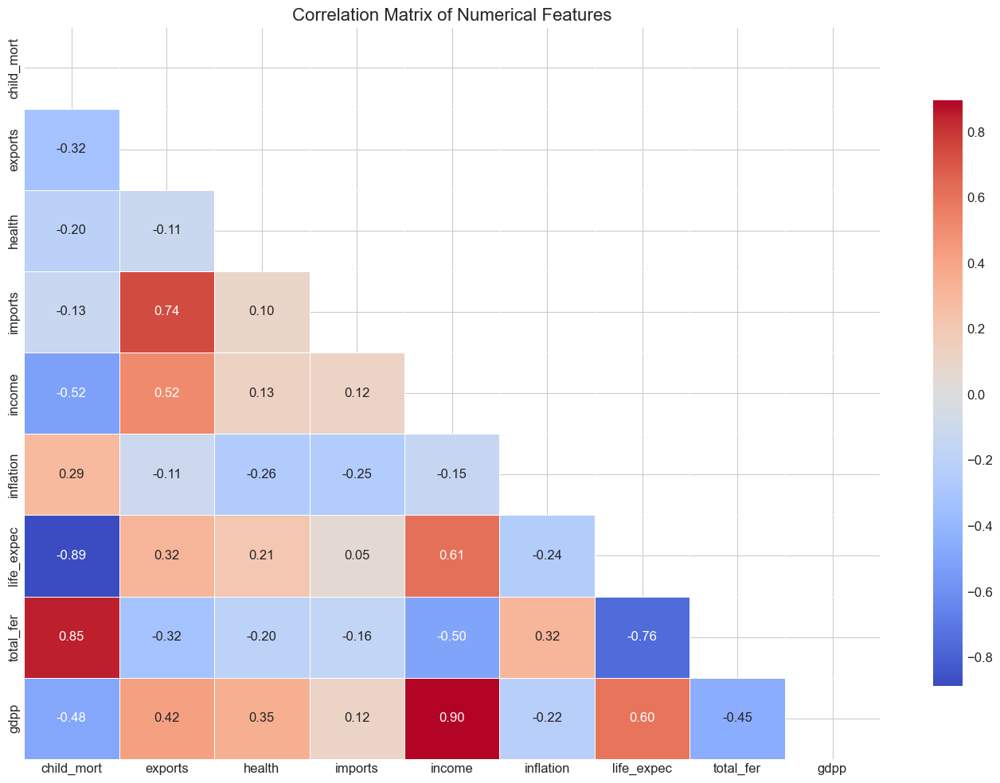

In [11]:
# Calculate correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(14, 10))
mask = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
            mask=mask, linewidths=0.5, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Numerical Features', fontsize=16)
plt.tight_layout()
plt.show()

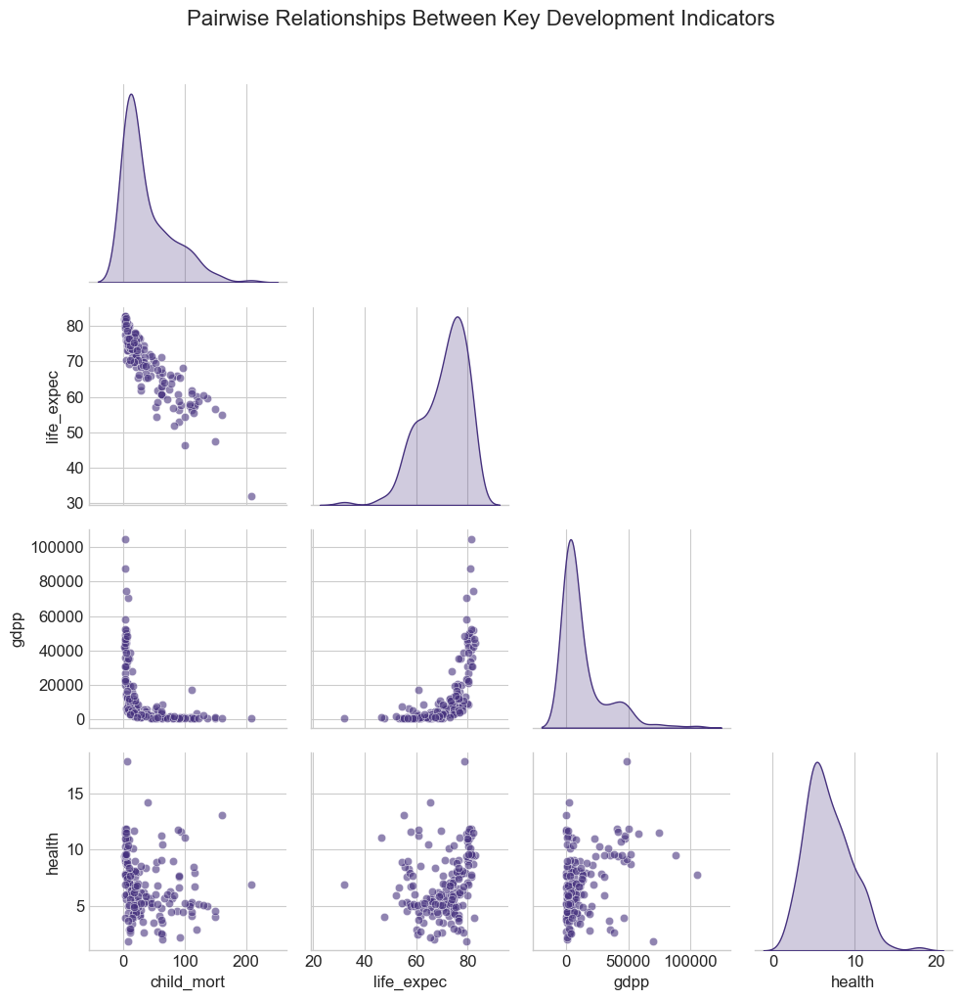

In [12]:
# Let's focus on key relationships

# Create pairplot for key development indicators
key_indicators = ['child_mort', 'life_expec', 'gdpp', 'health']
sns.pairplot(df[key_indicators], corner=True, diag_kind='kde', plot_kws={'alpha': 0.6})
plt.suptitle('Pairwise Relationships Between Key Development Indicators', y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

## Creating Interactive Visualizations

In [13]:
# Create an interactive scatter plot using plotly
fig = px.scatter(df, x='gdpp', y='life_expec', 
                 size='income', color='child_mort',
                 hover_name='country',
                 log_x=True,  # Using log scale for GDP per person
                 color_continuous_scale='Viridis',
                 size_max=60,
                 title='GDP per Person vs Life Expectancy')

fig.update_layout(
    xaxis_title='GDP per Person (log scale)',
    yaxis_title='Life Expectancy (years)',
    coloraxis_colorbar_title='Child Mortality Rate',
    height=800,
    width=1200
)

fig.show()

In [14]:
# Create an interactive bubble chart for trade and economic indicators
fig = px.scatter(df, x='exports', y='imports', 
                 size='gdpp', color='inflation',
                 hover_name='country',
                 color_continuous_scale='RdYlGn_r',  # Red for high inflation, green for low
                 size_max=60,
                 title='Exports vs Imports Colored by Inflation Rate')

fig.update_layout(
    xaxis_title='Exports (% of GDP)',
    yaxis_title='Imports (% of GDP)',
    coloraxis_colorbar_title='Inflation Rate (%)',
    height=800,
    width=1200
)

fig.show()

## Feature Engineering

In [15]:
# Let's create some new features that might be useful for clustering

# Trade balance (exports - imports)
df_cleaned['trade_balance'] = df_cleaned['exports'] - df_cleaned['imports']

# Development index (simplified HDI-like measure)
# Normalizing components
life_exp_norm = (df_cleaned['life_expec'] - df_cleaned['life_expec'].min()) / (df_cleaned['life_expec'].max() - df_cleaned['life_expec'].min())
income_norm = (np.log1p(df_cleaned['income']) - np.log1p(df_cleaned['income'].min())) / (np.log1p(df_cleaned['income'].max()) - np.log1p(df_cleaned['income'].min()))
child_mort_norm = 1 - ((df_cleaned['child_mort'] - df_cleaned['child_mort'].min()) / (df_cleaned['child_mort'].max() - df_cleaned['child_mort'].min()))

# Combining into a single index
df_cleaned['development_index'] = (life_exp_norm + income_norm + child_mort_norm) / 3

# Health effectiveness (life expectancy relative to health expenditure)
df_cleaned['health_effectiveness'] = df_cleaned['life_expec'] / df_cleaned['health']

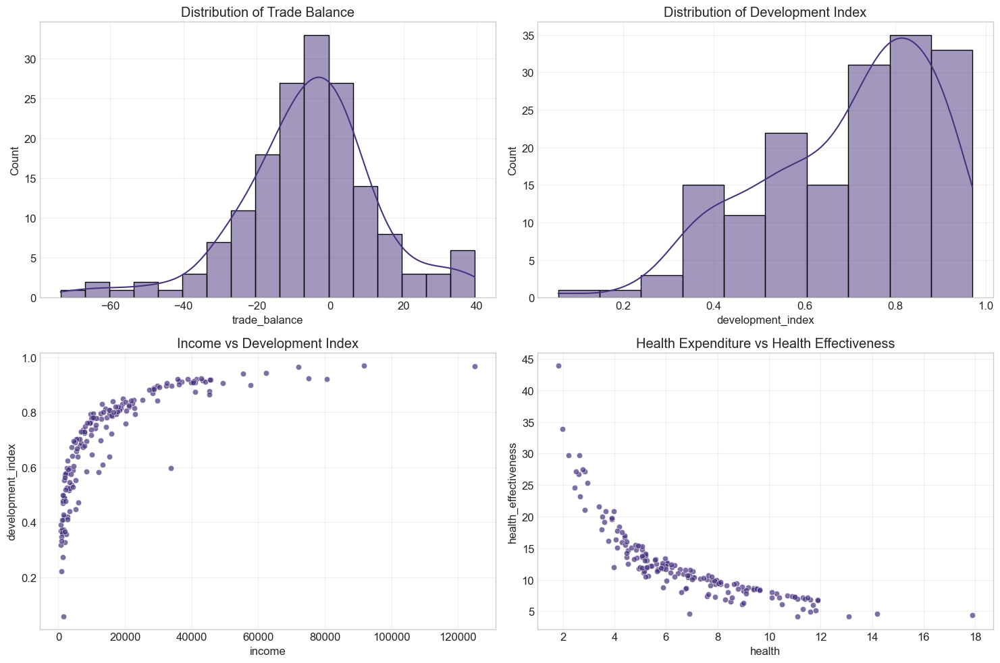

In [16]:
# Visualize the new features
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
sns.histplot(df_cleaned['trade_balance'], kde=True)
plt.title('Distribution of Trade Balance')
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 2)
sns.histplot(df_cleaned['development_index'], kde=True)
plt.title('Distribution of Development Index')
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 3)
sns.scatterplot(x='income', y='development_index', data=df_cleaned, alpha=0.7)
plt.title('Income vs Development Index')
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 4)
sns.scatterplot(x='health', y='health_effectiveness', data=df_cleaned, alpha=0.7)
plt.title('Health Expenditure vs Health Effectiveness')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Data Scaling and Preparation for Clustering

In [17]:
# Create features for clustering
clustering_features = ['log_income', 'log_child_mort', 'life_expec', 'log_exports', 
                       'log_imports', 'health', 'inflation', 'total_fer', 
                       'trade_balance', 'development_index']

# Prepare the data for clustering
X = df_cleaned[clustering_features].copy()

# Check for any remaining missing values
print("Missing values in clustering features:")
print(X.isnull().sum())

# Fill any missing values with the median (if any exist)
X = X.fillna(X.median())

# Scale the data using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert to DataFrame for easier analysis
X_scaled_df = pd.DataFrame(X_scaled, columns=clustering_features, index=df_cleaned.index)

# Preview the scaled data
X_scaled_df.head()

Missing values in clustering features:
log_income           0
log_child_mort       0
life_expec           0
log_exports          0
log_imports          0
health               0
inflation            0
total_fer            0
trade_balance        0
development_index    0
dtype: int64


,log_income,log_child_mort,life_expec,log_exports,log_imports,health,inflation,total_fer,trade_balance,development_index
0,-1.413035,1.278012,-1.619092,-1.764313,0.147868,0.279088,0.157336,1.902882,-1.541835,-1.528840
1,0.071660,-0.239708,0.647866,-0.283872,0.291835,-0.097016,-0.312347,-0.859973,-0.784652,0.417709
2,0.285240,0.198464,0.670423,0.184161,-0.498946,-0.966073,0.789274,-0.038404,0.676765,0.419499
3,-0.353257,1.531191,-1.179234,0.908223,0.065136,-1.448071,1.387054,2.128151,1.333344,-1.208186
4,0.605586,-0.648481,0.704258,0.437193,0.642228,-0.286894,-0.601749,-0.541946,-0.403413,0.707823


## Dimensionality Reduction for Visualization

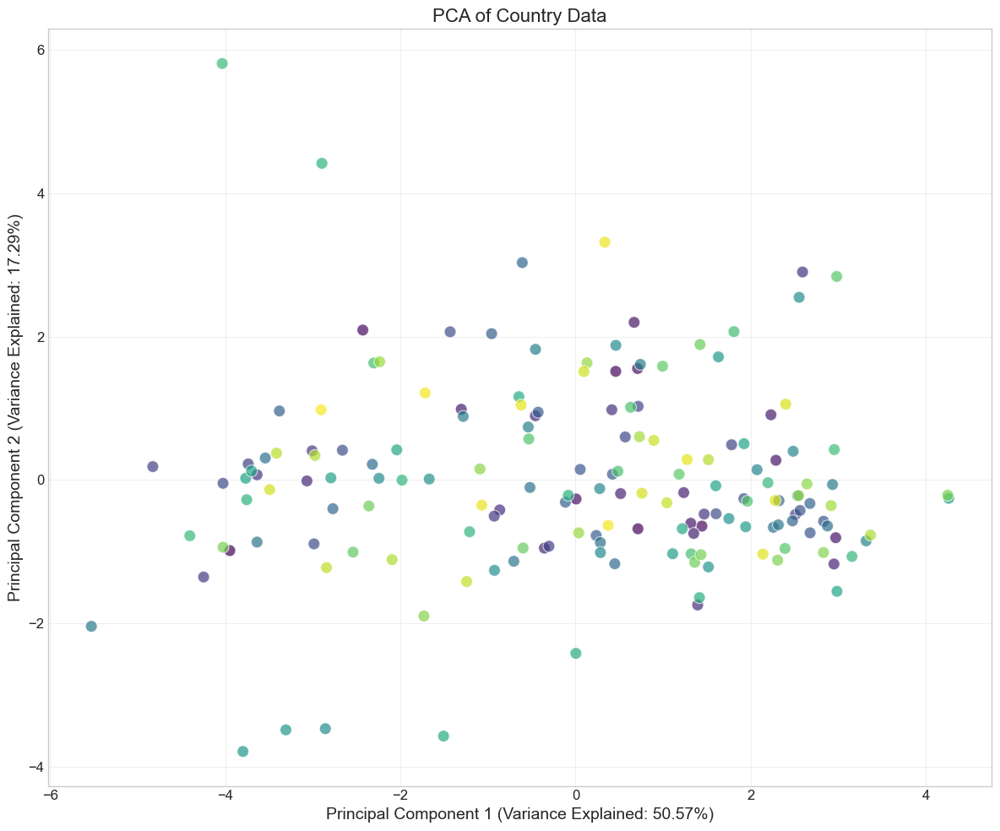

In [18]:
# Import PCA
from sklearn.decomposition import PCA

# Apply PCA for visualization
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

# Create a DataFrame for the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['country'] = df_cleaned['country'].values

# Visualize the PCA results
plt.figure(figsize=(12, 10))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, hue='country', alpha=0.7, s=100, palette='viridis')
plt.title('PCA of Country Data', fontsize=16)
plt.xlabel(f'Principal Component 1 (Variance Explained: {pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'Principal Component 2 (Variance Explained: {pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.grid(True, alpha=0.3)

# Hide the legend if there are too many countries
plt.legend([],[], frameon=False)

plt.tight_layout()
plt.show()

In [19]:
# Interactive PCA plot with Plotly
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
pca_df['country'] = df_cleaned['country'].values
pca_df['income'] = df_cleaned['income'].values
pca_df['life_expec'] = df_cleaned['life_expec'].values
pca_df['child_mort'] = df_cleaned['child_mort'].values

# Create the plot
fig = px.scatter(
    pca_df, 
    x='PC1', 
    y='PC2', 
    hover_name='country',
    color='life_expec',
    size='income',
    color_continuous_scale='Viridis',
    size_max=50,
    opacity=0.7,
    title='PCA of Country Data - Interactive Visualization'
)

fig.update_layout(
    xaxis_title=f'Principal Component 1 (Variance Explained: {pca.explained_variance_ratio_[0]:.2%})',
    yaxis_title=f'Principal Component 2 (Variance Explained: {pca.explained_variance_ratio_[1]:.2%})',
    height=800,
    width=1200
)

fig.show()

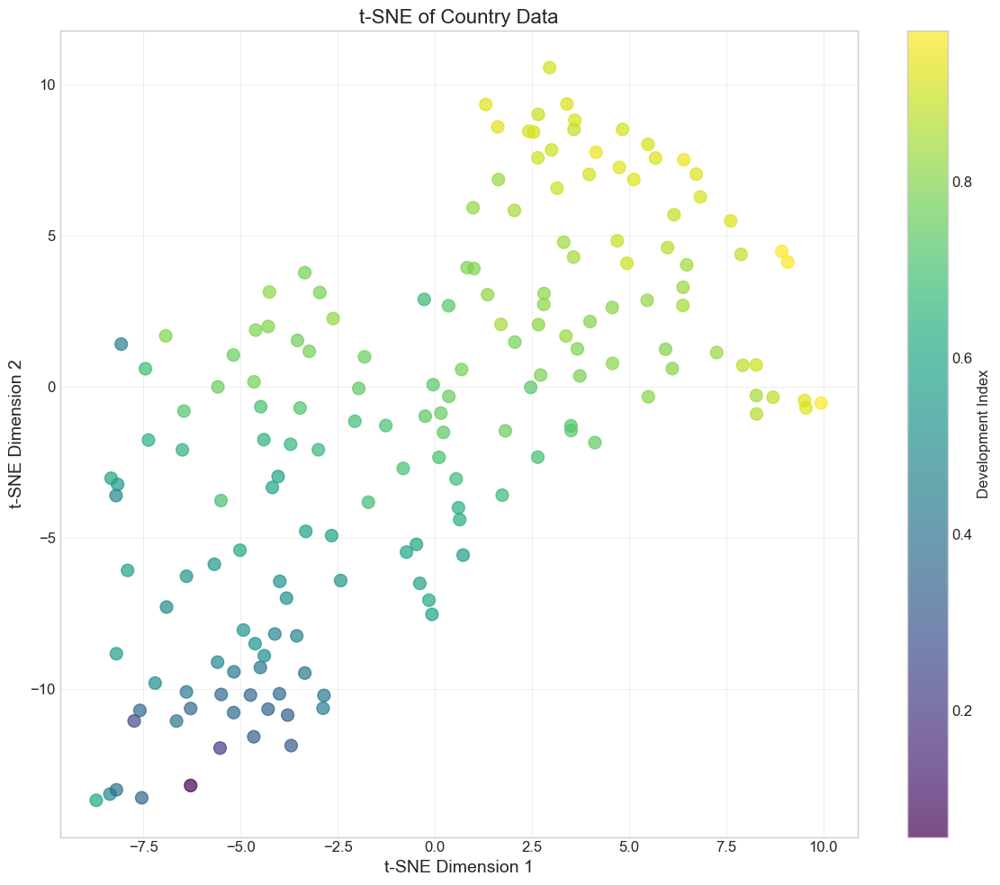

In [20]:
# We can also use t-SNE for non-linear dimensionality reduction
from sklearn.manifold import TSNE

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=3000)
tsne_result = tsne.fit_transform(X_scaled)

# Create a DataFrame for the t-SNE results
tsne_df = pd.DataFrame(data=tsne_result, columns=['tSNE1', 'tSNE2'])
tsne_df['country'] = df_cleaned['country'].values
tsne_df['development_index'] = df_cleaned['development_index'].values

# Visualize the t-SNE results
plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    tsne_df['tSNE1'], 
    tsne_df['tSNE2'], 
    c=tsne_df['development_index'], 
    cmap='viridis', 
    alpha=0.7, 
    s=100
)
plt.colorbar(scatter, label='Development Index')
plt.title('t-SNE of Country Data', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [21]:
# Interactive t-SNE plot
fig = px.scatter(
    tsne_df, 
    x='tSNE1', 
    y='tSNE2', 
    hover_name='country',
    color='development_index',
    color_continuous_scale='Viridis',
    size='development_index',
    size_max=50,
    opacity=0.7,
    title='t-SNE of Country Data - Interactive Visualization'
)

fig.update_layout(
    xaxis_title='t-SNE Dimension 1',
    yaxis_title='t-SNE Dimension 2',
    height=800,
    width=1200
)

fig.show()

## Part 2: Unsupervised Learning Analysis

Now that we have explored and prepared our data, we'll apply various unsupervised learning techniques to identify patterns and group countries based on their socioeconomic indicators.

### 1. K-Means Clustering

In [22]:
# Import necessary libraries
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.cm as cm

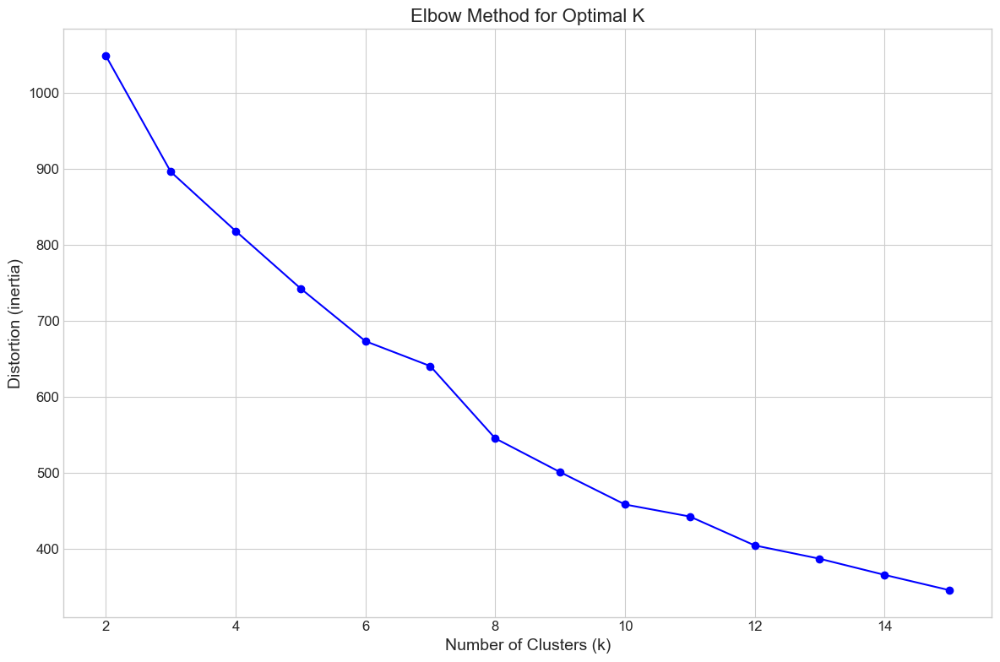

In [23]:
# Determine the optimal number of clusters using the Elbow Method
plt.figure(figsize=(12, 8))

# Calculate Sum of Squared Distances (inertia) for different k values
distortions = []
K_range = range(2, 16)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    distortions.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(K_range, distortions, 'bo-')
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Distortion (inertia)', fontsize=14)
plt.title('Elbow Method for Optimal K', fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

For n_clusters = 2, the silhouette score is 0.3475
For n_clusters = 3, the silhouette score is 0.2260
For n_clusters = 4, the silhouette score is 0.2284
For n_clusters = 5, the silhouette score is 0.2259
For n_clusters = 6, the silhouette score is 0.2129
For n_clusters = 7, the silhouette score is 0.1848
For n_clusters = 8, the silhouette score is 0.2317
For n_clusters = 9, the silhouette score is 0.1993
For n_clusters = 10, the silhouette score is 0.2050
For n_clusters = 11, the silhouette score is 0.1970
For n_clusters = 12, the silhouette score is 0.2120
For n_clusters = 13, the silhouette score is 0.2126
For n_clusters = 14, the silhouette score is 0.2079


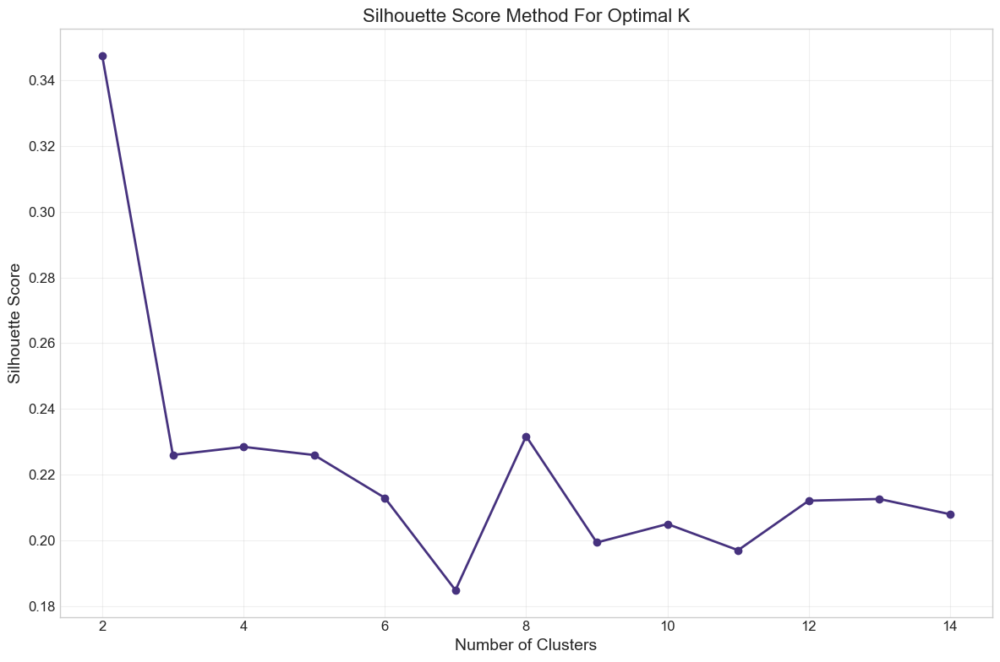

In [24]:
# Calculate silhouette scores for different values of k
silhouette_scores = []
range_n_clusters = range(2, 15)

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print(f"For n_clusters = {n_clusters}, the silhouette score is {silhouette_avg:.4f}")

# Plot silhouette scores
plt.figure(figsize=(12, 8))
plt.plot(range_n_clusters, silhouette_scores, 'o-', linewidth=2)
plt.title('Silhouette Score Method For Optimal K', fontsize=16)
plt.xlabel('Number of Clusters', fontsize=14)
plt.ylabel('Silhouette Score', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

The challenge here is that the "best performing" silhouette is 2 clusters, which will essentially provide a high-level distinction between "developing" and "developed" economies. In order to achieve greater explanatory power, I pushed further and used the local maximum of 8 clusters instead

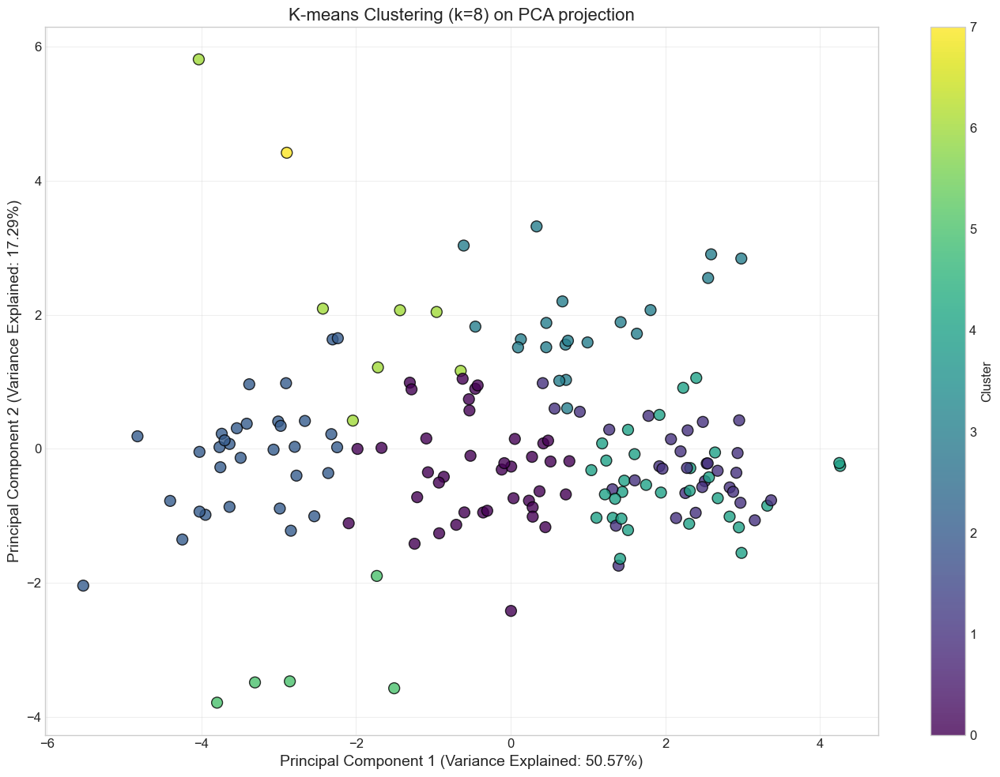

In [25]:
# Based on the elbow method and silhouette scores, choose the optimal k value
optimal_k = 8

# Fit K-means with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_cleaned['kmeans_cluster'] = kmeans.fit_predict(X_scaled)

# Visualize the clusters on PCA projection
plt.figure(figsize=(14, 10))
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], 
                     c=df_cleaned['kmeans_cluster'], cmap='viridis', 
                     s=100, alpha=0.8, edgecolors='black')
plt.title(f'K-means Clustering (k={optimal_k}) on PCA projection', fontsize=16)
plt.xlabel(f'Principal Component 1 (Variance Explained: {pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'Principal Component 2 (Variance Explained: {pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Cluster')
plt.tight_layout()
plt.show()

In [26]:
# Analyze clusters characteristics
cluster_stats = df_cleaned.groupby('kmeans_cluster')[numerical_columns].mean()
print("K-means Cluster Characteristics:")
cluster_stats

K-means Cluster Characteristics:


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
kmeans_cluster,,,,,,,,,
0,32.520513,35.548205,6.092308,50.192308,6790.256410,7.052077,69.602564,2.738718,3186.512821
1,6.778125,33.653125,9.908750,34.012500,31856.875000,2.535344,79.459375,1.784687,33649.062500
2,99.943750,22.081563,6.287813,37.640625,1778.218750,8.689219,58.509375,5.329688,810.781250
3,22.675000,44.985000,4.248000,27.600000,30091.000000,15.252000,73.445000,2.410500,14609.500000
4,8.590323,73.064516,6.727742,73.106452,27132.258065,2.510290,76.732258,1.706774,19575.806452
5,63.960000,28.920000,11.390000,87.140000,1986.000000,4.350000,59.020000,3.972000,1427.400000
6,86.242857,55.128571,4.270000,46.600000,9350.000000,36.242857,63.400000,4.921429,4408.571429
7,64.400000,0.109000,1.970000,0.065900,3720.000000,7.040000,66.800000,2.410000,988.000000


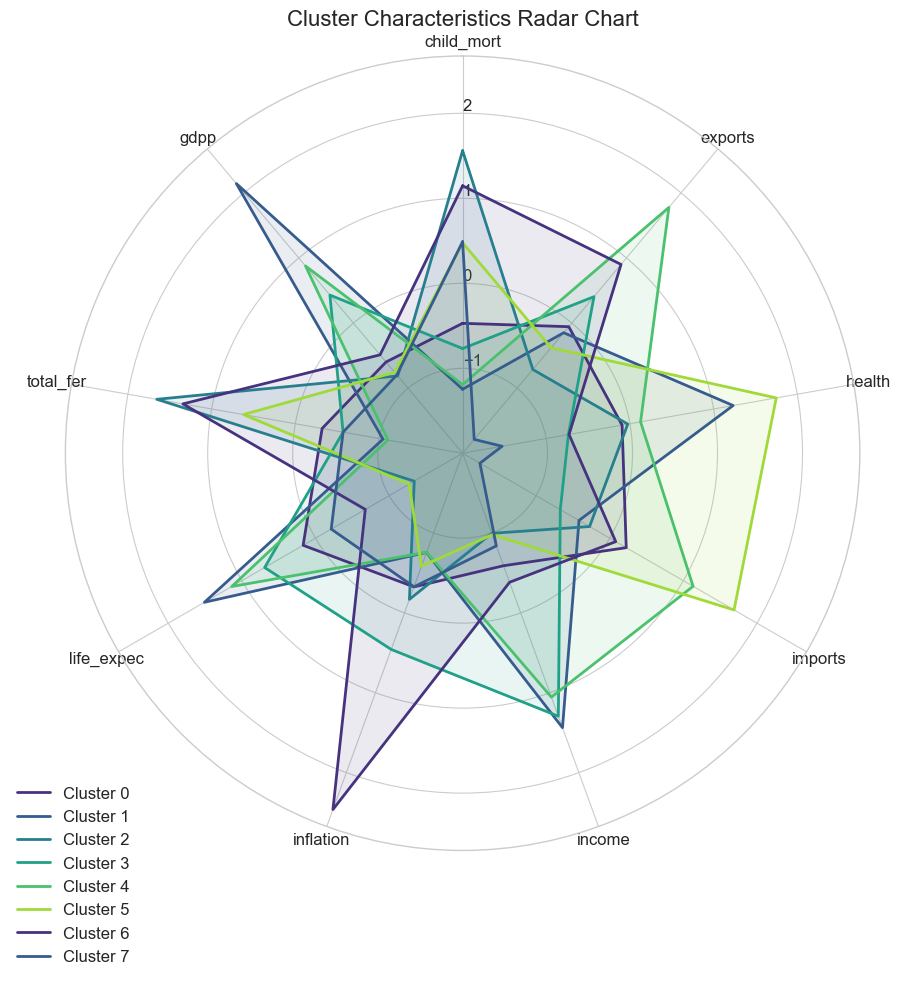

In [27]:
# Visualize the cluster characteristics using a radar chart
def radar_chart(cluster_stats, cols):
    # Number of variables
    N = len(cols)
    
    # Scale the data for the radar chart
    scaler = StandardScaler()
    scaled_stats = scaler.fit_transform(cluster_stats[cols])
    scaled_stats_df = pd.DataFrame(scaled_stats, index=cluster_stats.index, columns=cols)
    
    # Create angles for the radar chart
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]  # Close the loop
    
    # Create the radar chart
    fig, ax = plt.subplots(figsize=(12, 10), subplot_kw=dict(polar=True))
    
    # Add features to the chart
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)
    
    # Add variable labels
    plt.xticks(angles[:-1], cols, size=12)
    
    # Plot each cluster
    for i, cluster in enumerate(scaled_stats_df.index):
        values = scaled_stats_df.loc[cluster].values.tolist()
        values += values[:1]  # Close the loop
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=f'Cluster {cluster}')
        ax.fill(angles, values, alpha=0.1)
    
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.title('Cluster Characteristics Radar Chart', size=16)
    plt.tight_layout()
    plt.show()

# Select relevant columns for the radar chart
radar_cols = ['child_mort', 'exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp']
radar_chart(cluster_stats, radar_cols)

In [28]:
# Interactive 3D visualization of clusters with PCA
# Apply PCA with 3 components
pca3d = PCA(n_components=3)
pca3d_result = pca3d.fit_transform(X_scaled)

# Create a DataFrame for the 3D PCA results with cluster information
pca3d_df = pd.DataFrame(data=pca3d_result, columns=['PC1', 'PC2', 'PC3'])
pca3d_df['cluster'] = df_cleaned['kmeans_cluster'].values
pca3d_df['country'] = df_cleaned['country'].values

# Create the 3D scatter plot
fig = px.scatter_3d(
    pca3d_df, 
    x='PC1', 
    y='PC2', 
    z='PC3',
    color='cluster',
    hover_name='country',
    opacity=0.8,
    title=f'K-means Clustering (k={optimal_k}) - 3D PCA Visualization'
)

fig.update_layout(
    scene=dict(
        xaxis_title=f'PC1 ({pca3d.explained_variance_ratio_[0]:.2%})',
        yaxis_title=f'PC2 ({pca3d.explained_variance_ratio_[1]:.2%})',
        zaxis_title=f'PC3 ({pca3d.explained_variance_ratio_[2]:.2%})'
    ),
    height=800,
    width=1000
)

fig.show()

### 2. Hyperparameter Optimization for K-Means

In [29]:
# Hyperparameter optimization for K-means
# Testing different initializations and algorithm options
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'n_clusters': list(range(3, 10)),
    'init': ['k-means++', 'random'],
    'n_init': [10, 20, 30],
    'algorithm': ['lloyd', 'elkan']
}

# Use silhouette score as metric for evaluation
def silhouette_score_metric(estimator, X):
    cluster_labels = estimator.fit_predict(X)
    score = silhouette_score(X, cluster_labels)
    return score

# Grid search with silhouette score
gs = GridSearchCV(
    KMeans(),
    param_grid,
    scoring=silhouette_score_metric,
    cv=3,
    verbose=1,
    n_jobs=-1
)

# Fit grid search
gs.fit(X_scaled)

# Best parameters and score
print("Best parameters:", gs.best_params_)
print("Best silhouette score:", gs.best_score_)

Fitting 3 folds for each of 84 candidates, totalling 252 fits
Best parameters: {'algorithm': 'elkan', 'init': 'k-means++', 'n_clusters': 3, 'n_init': 30}
Best silhouette score: 0.3280822521967028


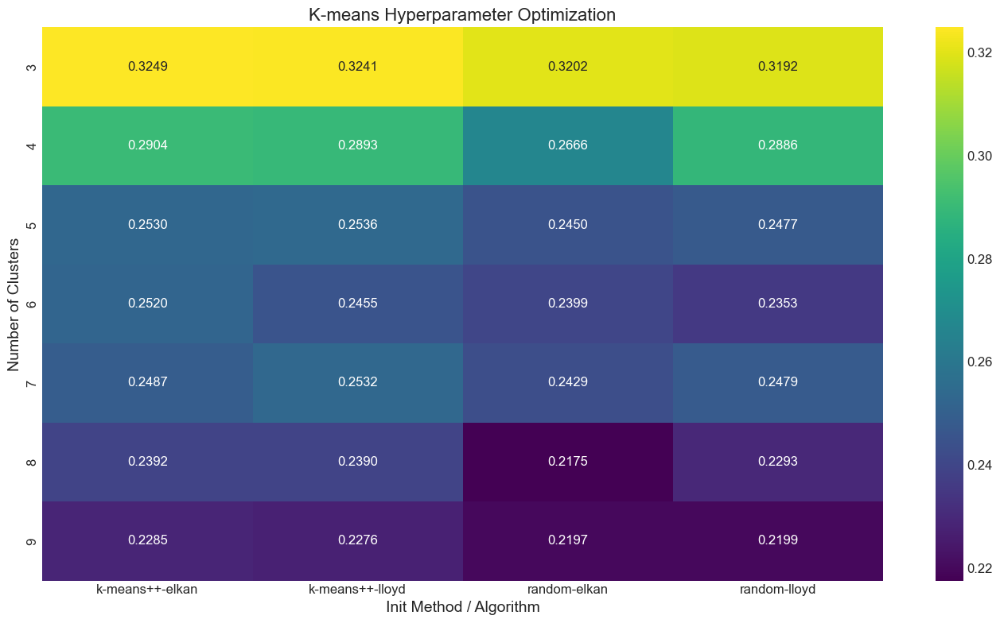

In [30]:
# Visualize grid search results
results = pd.DataFrame(gs.cv_results_)

# Create a pivot table to visualize n_clusters vs init effect on score
pivot_table = results.pivot_table(
    index='param_n_clusters', 
    columns=['param_init', 'param_algorithm'],
    values='mean_test_score'
)

plt.figure(figsize=(14, 8))
sns.heatmap(pivot_table, annot=True, cmap='viridis', fmt='.4f')
plt.title('K-means Hyperparameter Optimization', fontsize=16)
plt.xlabel('Init Method / Algorithm', fontsize=14)
plt.ylabel('Number of Clusters', fontsize=14)
plt.tight_layout()
plt.show()

In [31]:
# Apply optimized K-means
optimized_kmeans = KMeans(**gs.best_params_, random_state=42)
df_cleaned['optimized_kmeans_cluster'] = optimized_kmeans.fit_predict(X_scaled)

# Compare original vs optimized clusters
comparison_df = pd.DataFrame({
    'Original': df_cleaned['kmeans_cluster'],
    'Optimized': df_cleaned['optimized_kmeans_cluster']
})

# Count matches and mismatches
print("Cluster Assignment Comparison (Original vs Optimized):")
print(pd.crosstab(
    comparison_df['Original'], 
    comparison_df['Optimized'], 
    rownames=['Original'], 
    colnames=['Optimized']
))

Cluster Assignment Comparison (Original vs Optimized):
Optimized   0   1   2
Original             
0           2   0  37
1           0  29   3
2          32   0   0
3           0   5  15
4           0  30   1
5           5   0   0
6           3   0   4
7           1   0   0


### 3. Hierarchical Clustering

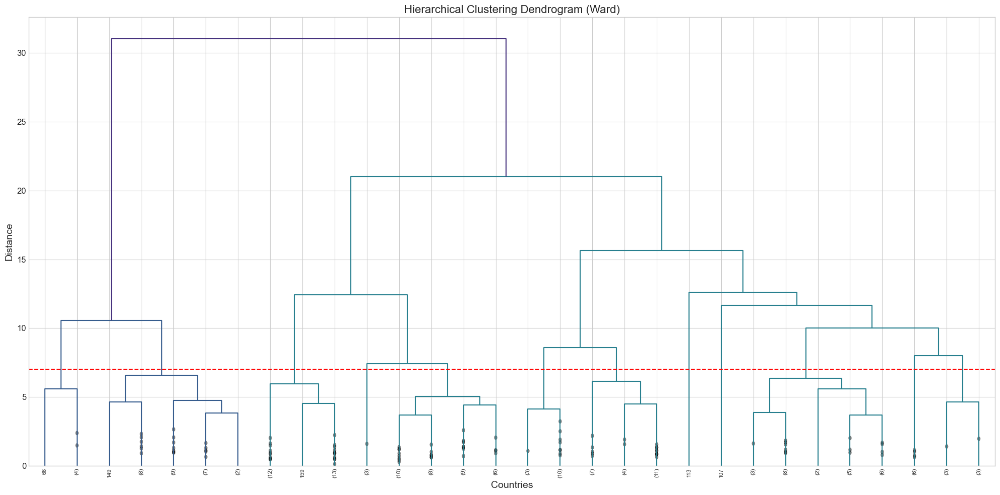

In [32]:
# Hierarchical Clustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import AgglomerativeClustering

# Create linkage matrix using Ward's method
Z = linkage(X_scaled, method='ward')

# Plot the dendrogram
plt.figure(figsize=(20, 10))
plt.title('Hierarchical Clustering Dendrogram (Ward)', fontsize=16)
plt.xlabel('Countries', fontsize=14)
plt.ylabel('Distance', fontsize=14)

# Customize dendrogram
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
    truncate_mode='lastp',  # show only the last p merged clusters
    p=30,  # show only the last p merged clusters
    show_contracted=True  # to get a distribution impression in truncated branches
)

plt.axhline(y=7, color='r', linestyle='--')  # Add a horizontal line for threshold
plt.tight_layout()
plt.show()

For n_clusters = 2, the silhouette score is 0.3409
For n_clusters = 3, the silhouette score is 0.2012
For n_clusters = 4, the silhouette score is 0.1908
For n_clusters = 5, the silhouette score is 0.1993
For n_clusters = 6, the silhouette score is 0.1787
For n_clusters = 7, the silhouette score is 0.1875
For n_clusters = 8, the silhouette score is 0.1991
For n_clusters = 9, the silhouette score is 0.2155
For n_clusters = 10, the silhouette score is 0.1993
For n_clusters = 11, the silhouette score is 0.2060
For n_clusters = 12, the silhouette score is 0.2136
For n_clusters = 13, the silhouette score is 0.2003
For n_clusters = 14, the silhouette score is 0.2035


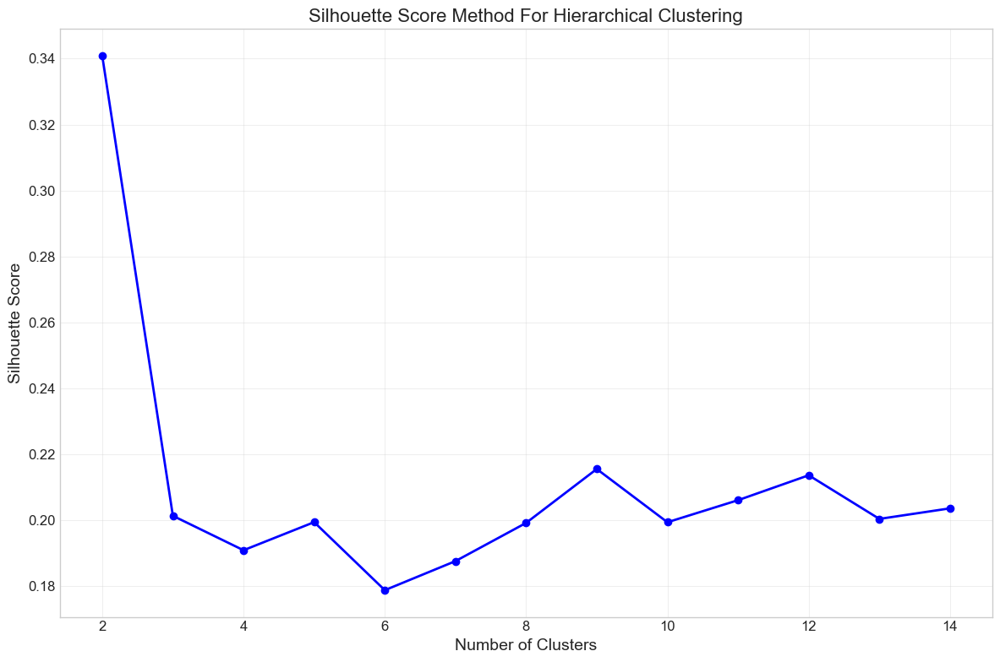

In [33]:
# Determine the optimal number of clusters for hierarchical clustering
# Silhouette analysis
silhouette_scores_hc = []
range_n_clusters = range(2, 15)

for n_clusters in range_n_clusters:
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores_hc.append(silhouette_avg)
    print(f"For n_clusters = {n_clusters}, the silhouette score is {silhouette_avg:.4f}")

# Plot silhouette scores
plt.figure(figsize=(12, 8))
plt.plot(range_n_clusters, silhouette_scores_hc, 'bo-', linewidth=2)
plt.title('Silhouette Score Method For Hierarchical Clustering', fontsize=16)
plt.xlabel('Number of Clusters', fontsize=14)
plt.ylabel('Silhouette Score', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Again, the clearly "winning" silhouette is 2 - but we want to push for a greater level of explanatory efficacy than that simple distinction, on which basis we select a local maximum of 9 clusters

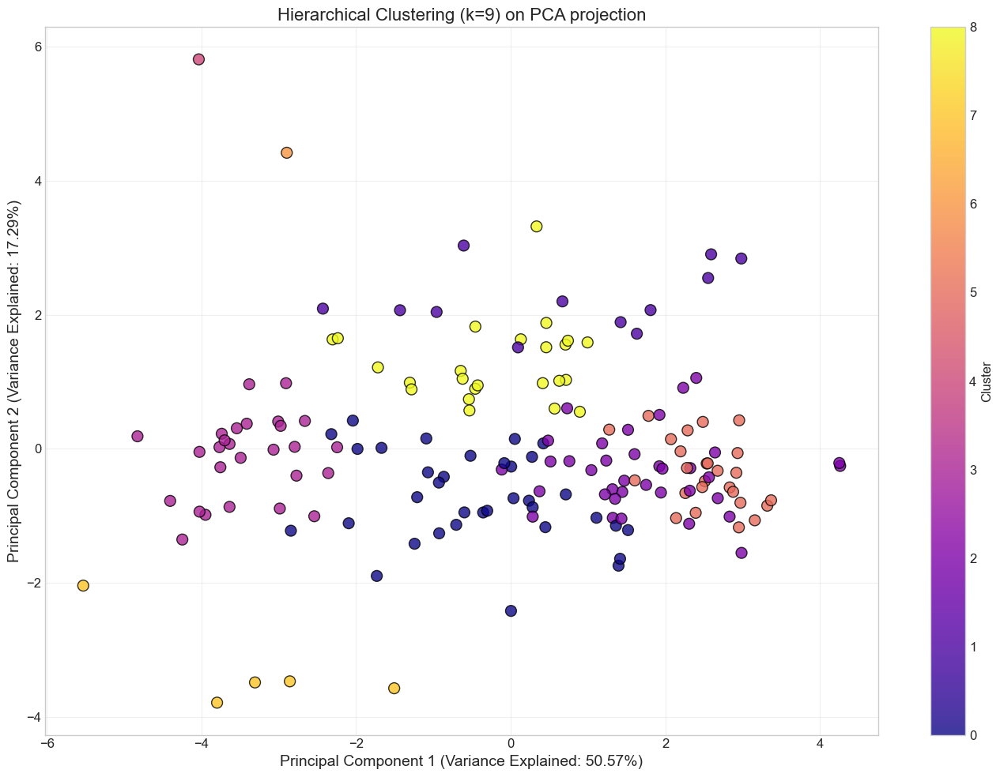

In [34]:
# Based on the dendrogram and silhouette scores, choose optimal number of clusters
optimal_hc_clusters = 9

# Apply Agglomerative Clustering with the optimal number of clusters
hc = AgglomerativeClustering(n_clusters=optimal_hc_clusters, linkage='ward')
df_cleaned['hc_cluster'] = hc.fit_predict(X_scaled)

# Visualize the clusters on PCA projection
plt.figure(figsize=(14, 10))
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], 
                     c=df_cleaned['hc_cluster'], cmap='plasma', 
                     s=100, alpha=0.8, edgecolors='black')
plt.title(f'Hierarchical Clustering (k={optimal_hc_clusters}) on PCA projection', fontsize=16)
plt.xlabel(f'Principal Component 1 (Variance Explained: {pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'Principal Component 2 (Variance Explained: {pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Cluster')
plt.tight_layout()
plt.show()

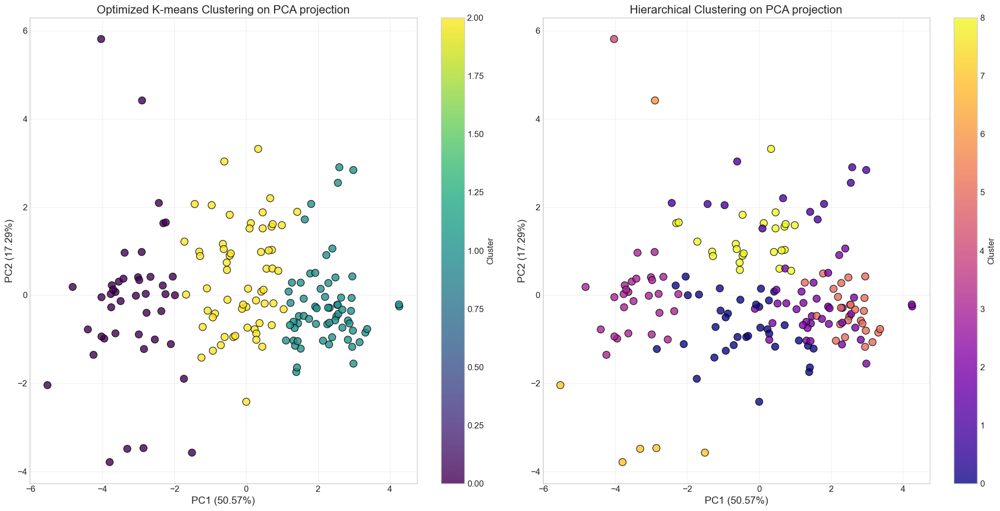

In [35]:
# Compare K-means and Hierarchical Clustering
plt.figure(figsize=(20, 10))

# K-means plot
plt.subplot(1, 2, 1)
scatter1 = plt.scatter(pca_result[:, 0], pca_result[:, 1], 
                      c=df_cleaned['optimized_kmeans_cluster'], cmap='viridis', 
                      s=100, alpha=0.8, edgecolors='black')
plt.title(f'Optimized K-means Clustering on PCA projection', fontsize=16)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.colorbar(scatter1, label='Cluster')
plt.grid(True, alpha=0.3)

# Hierarchical plot
plt.subplot(1, 2, 2)
scatter2 = plt.scatter(pca_result[:, 0], pca_result[:, 1], 
                      c=df_cleaned['hc_cluster'], cmap='plasma', 
                      s=100, alpha=0.8, edgecolors='black')
plt.title(f'Hierarchical Clustering on PCA projection', fontsize=16)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.colorbar(scatter2, label='Cluster')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [36]:
# Compare cluster assignments between methods
print("Cluster Assignment Comparison (K-means vs Hierarchical):")
comparison = pd.crosstab(
    df_cleaned['optimized_kmeans_cluster'], 
    df_cleaned['hc_cluster'], 
    rownames=['K-means'], 
    colnames=['Hierarchical']
)
print(comparison)

# Calculate agreement percentage
total_agreements = sum(comparison.values.diagonal())
agreement_percentage = (total_agreements / len(df_cleaned)) * 100
print(f"\nAgreement Percentage: {agreement_percentage:.2f}%")

Cluster Assignment Comparison (K-means vs Hierarchical):
Hierarchical   0  1   2   3  4   5  6  7   8
K-means                                     
0              6  1   0  27  1   0  1  5   2
1              5  5  28   0  0  26  0  0   0
2             24  6   8   0  0   0  0  0  22

Agreement Percentage: 11.38%


### 4. DBSCAN Clustering

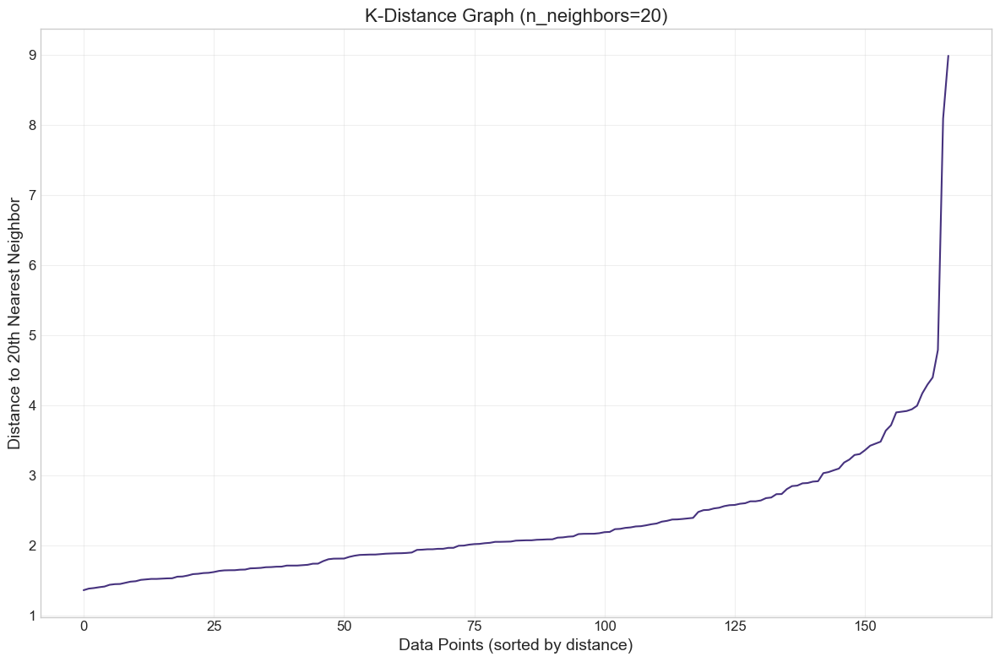

In [37]:
# DBSCAN Clustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

# Finding the optimal eps parameter for DBSCAN
# Calculate the optimal eps value using nearest neighbors
neighbors = NearestNeighbors(n_neighbors=20)
neighbors_fit = neighbors.fit(X_scaled)
distances, indices = neighbors_fit.kneighbors(X_scaled)

# Sort and plot the distances to find the elbow
distances = np.sort(distances[:, 19])  # Distances to the 20th nearest neighbor
plt.figure(figsize=(12, 8))
plt.plot(distances)
plt.title('K-Distance Graph (n_neighbors=20)', fontsize=16)
plt.xlabel('Data Points (sorted by distance)', fontsize=14)
plt.ylabel('Distance to 20th Nearest Neighbor', fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [38]:
# Hyperparameter tuning for DBSCAN
# Testing different combinations of eps and min_samples
eps_values = np.arange(0.2, 2.1, 0.2)
min_samples_values = [5, 10, 15, 20, 25]

dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:
        # Fit DBSCAN
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)
        
        # Count number of clusters and noise points
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        
        # Calculate silhouette score if more than one cluster and no all points are noise
        if n_clusters > 1 and n_noise < len(X_scaled):
            # Filter out noise points for silhouette calculation
            non_noise_indices = [i for i, label in enumerate(labels) if label != -1]
            silhouette_avg = silhouette_score(X_scaled[non_noise_indices], labels[non_noise_indices])
        else:
            silhouette_avg = -1  # Invalid score
        
        # Store results
        dbscan_results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'noise_percentage': (n_noise / len(X_scaled)) * 100,
            'silhouette_score': silhouette_avg
        })

# Convert results to DataFrame
dbscan_results_df = pd.DataFrame(dbscan_results)
print(dbscan_results_df.sort_values('silhouette_score', ascending=False).head(10))

    eps  min_samples  n_clusters  n_noise  noise_percentage  silhouette_score
21  1.0           10           2      147         88.023952          0.583604
31  1.4           10           2       86         51.497006          0.544223
36  1.6           10           2       55         32.934132          0.470712
25  1.2            5           3       83         49.700599          0.456262
42  1.8           15           2       47         28.143713          0.443442
30  1.4            5           2       47         28.143713          0.433072
15  0.8            5           2      151         90.419162          0.412553
20  1.0            5           2      121         72.455090          0.303721
29  1.2           25           0      167        100.000000         -1.000000
32  1.4           15           1      103         61.676647         -1.000000


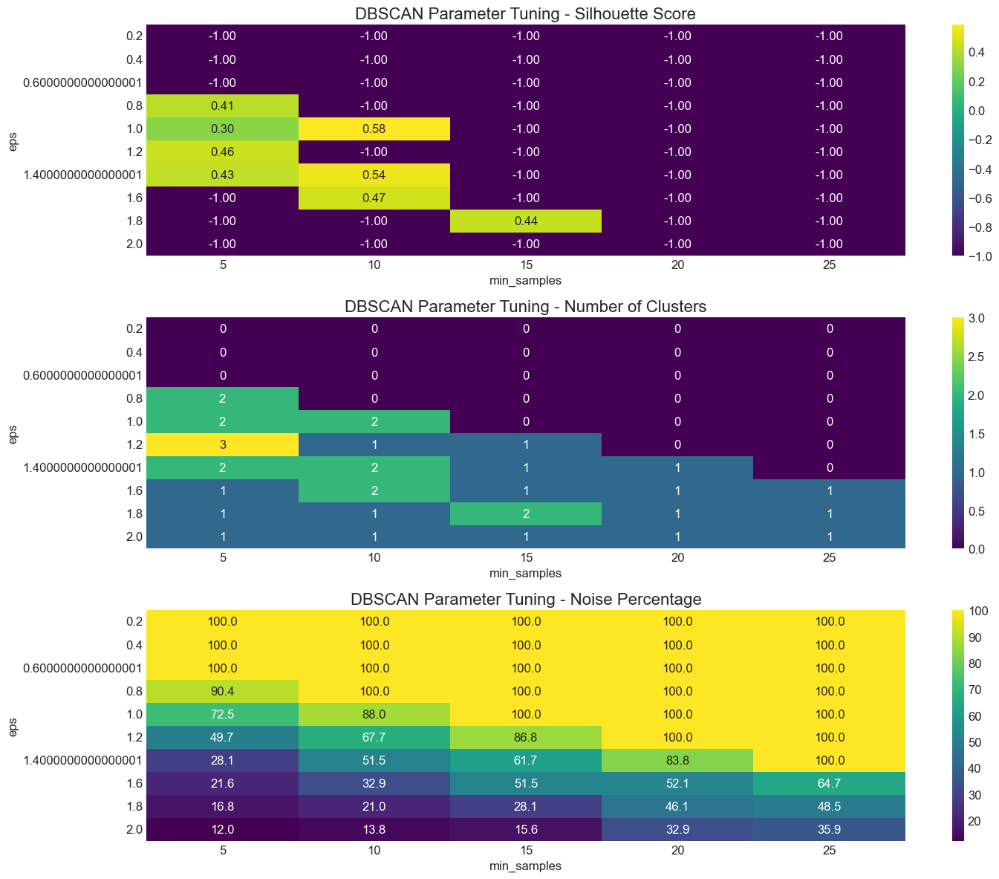

In [39]:
# Visualize DBSCAN hyperparameter tuning results
plt.figure(figsize=(15, 12))

# Create a pivot table for silhouette scores
silhouette_pivot = dbscan_results_df.pivot_table(
    index='eps', 
    columns='min_samples',
    values='silhouette_score'
)

# Create a pivot table for number of clusters
clusters_pivot = dbscan_results_df.pivot_table(
    index='eps', 
    columns='min_samples',
    values='n_clusters'
)

# Create a pivot table for noise percentage
noise_pivot = dbscan_results_df.pivot_table(
    index='eps', 
    columns='min_samples',
    values='noise_percentage'
)

# Plot heatmaps
plt.subplot(3, 1, 1)
sns.heatmap(silhouette_pivot, annot=True, cmap='viridis', fmt='.2f')
plt.title('DBSCAN Parameter Tuning - Silhouette Score', fontsize=16)

plt.subplot(3, 1, 2)
sns.heatmap(clusters_pivot, annot=True, cmap='viridis')
plt.title('DBSCAN Parameter Tuning - Number of Clusters', fontsize=16)

plt.subplot(3, 1, 3)
sns.heatmap(noise_pivot, annot=True, cmap='viridis', fmt='.1f')
plt.title('DBSCAN Parameter Tuning - Noise Percentage', fontsize=16)

plt.tight_layout()
plt.show()

In [40]:
# Based on hyperparameter tuning, select the best DBSCAN parameters
# This is based on the silhouette score, but still reflects relatively high noise...
best_eps = 1.0
best_min_samples = 10

# Apply DBSCAN with the best parameters
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
df_cleaned['dbscan_cluster'] = dbscan.fit_predict(X_scaled)

# Count clusters and noise points
unique_clusters = np.unique(df_cleaned['dbscan_cluster'])
n_clusters_dbscan = len(unique_clusters) - (1 if -1 in unique_clusters else 0)
n_noise = list(df_cleaned['dbscan_cluster']).count(-1)

print(f"DBSCAN identified {n_clusters_dbscan} clusters and {n_noise} noise points ({n_noise/len(df_cleaned):.1%} of the data)")

DBSCAN identified 2 clusters and 147 noise points (88.0% of the data)


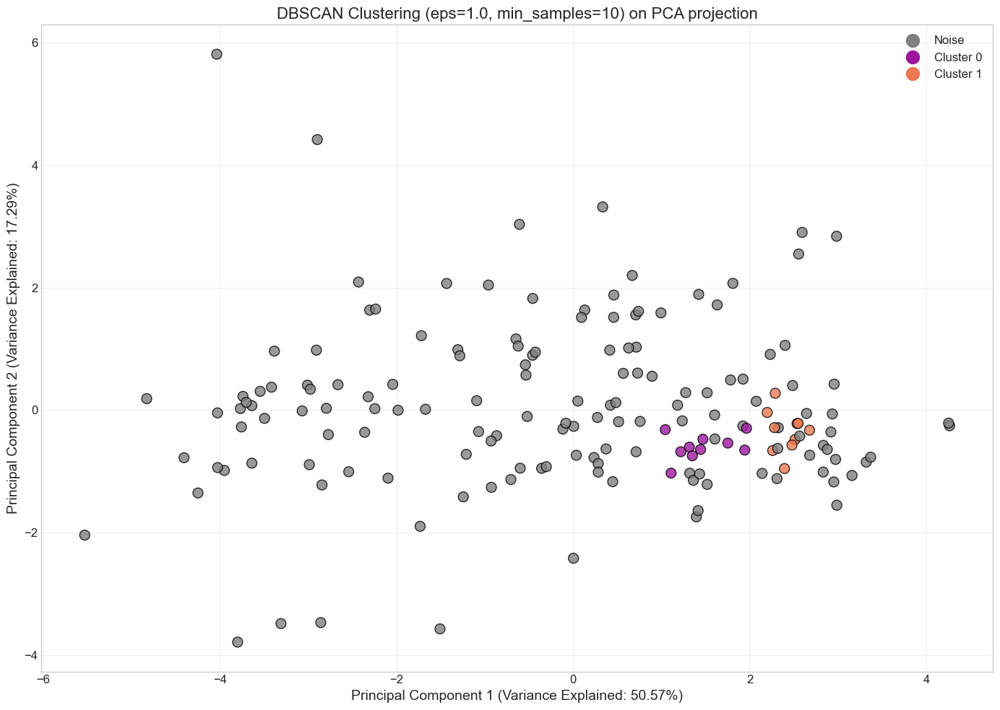

In [41]:
# Visualize DBSCAN clusters on PCA
plt.figure(figsize=(14, 10))

# Use a custom colormap for DBSCAN to highlight noise points
colors = np.array(['#808080'] + sns.color_palette('plasma', n_clusters_dbscan).as_hex())
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], 
                     c=[colors[i+1] if i >= 0 else colors[0] for i in df_cleaned['dbscan_cluster']], 
                     s=100, alpha=0.8, edgecolors='black')

# Create a custom legend
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label='Noise',
                              markerfacecolor=colors[0], markersize=15)]
for i in range(n_clusters_dbscan):
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', 
                                      label=f'Cluster {i}',
                                      markerfacecolor=colors[i+1], markersize=15))

plt.title(f'DBSCAN Clustering (eps={best_eps}, min_samples={best_min_samples}) on PCA projection', fontsize=16)
plt.xlabel(f'Principal Component 1 (Variance Explained: {pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'Principal Component 2 (Variance Explained: {pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend(handles=legend_elements, loc='best')
plt.tight_layout()
plt.show()

In [42]:
# Analyze DBSCAN clusters characteristics (excluding noise points)
dbscan_stats = df_cleaned[df_cleaned['dbscan_cluster'] != -1].groupby('dbscan_cluster')[numerical_columns].mean()
print("DBSCAN Cluster Characteristics (excluding noise points):")
dbscan_stats

DBSCAN Cluster Characteristics (excluding noise points):


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
dbscan_cluster,,,,,,,,,
0,11.18,47.08,6.924,54.43,17150.0,1.2696,74.81,1.679,11562.0
1,4.46,27.56,10.099,29.83,35190.0,1.2526,80.97,1.725,37460.0


### 5. Gaussian Mixture Models (GMM)

In [43]:
# Gaussian Mixture Models (GMM)
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV

# Define a custom scoring function for GaussianMixture
def gmm_bic_score(estimator, X):
    return -estimator.bic(X)  # Negative BIC because higher score is better

# Define parameter grid for GMM
param_grid = {
    'n_components': list(range(2, 11)),
    'covariance_type': ['spherical', 'diag', 'tied', 'full'],
    'init_params': ['kmeans', 'random']
}

# Grid search for GMM (This may take some time)
gs_gmm = GridSearchCV(
    GaussianMixture(random_state=42, max_iter=100),
    param_grid,
    scoring=gmm_bic_score,
    cv=3,
    verbose=1,
    n_jobs=-1
)

# Fit grid search
gs_gmm.fit(X_scaled)

# Best parameters and score
print("Best parameters for GMM:", gs_gmm.best_params_)
print("Best BIC score:", -gs_gmm.best_score_)  # Negative because we used negative BIC as score

Fitting 3 folds for each of 72 candidates, totalling 216 fits
Best parameters for GMM: {'covariance_type': 'tied', 'init_params': 'kmeans', 'n_components': 2}
Best BIC score: 1362.5062817876624


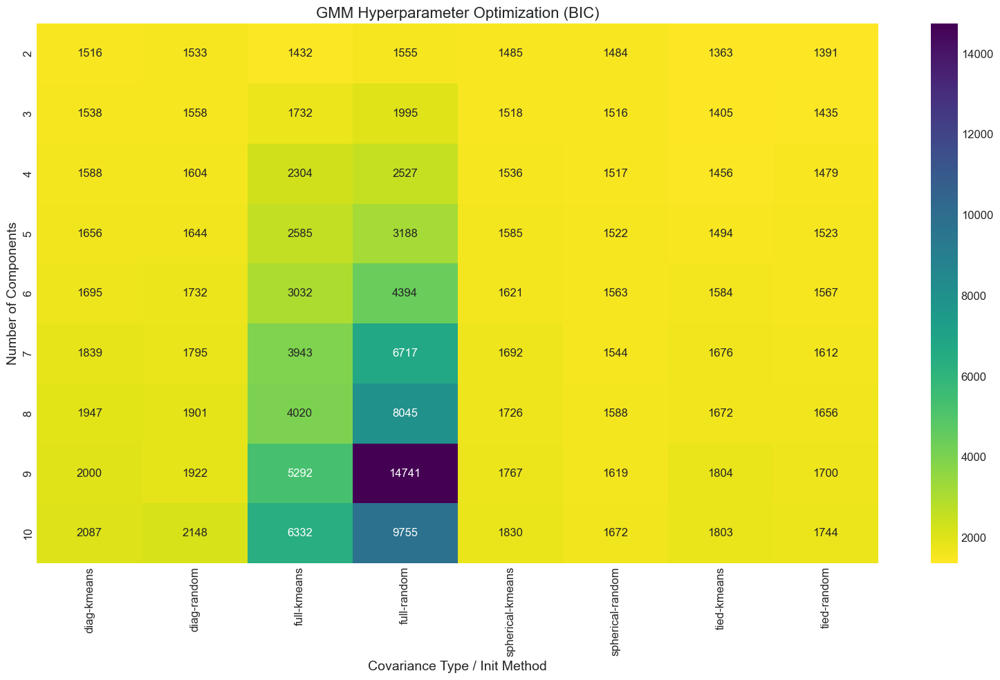

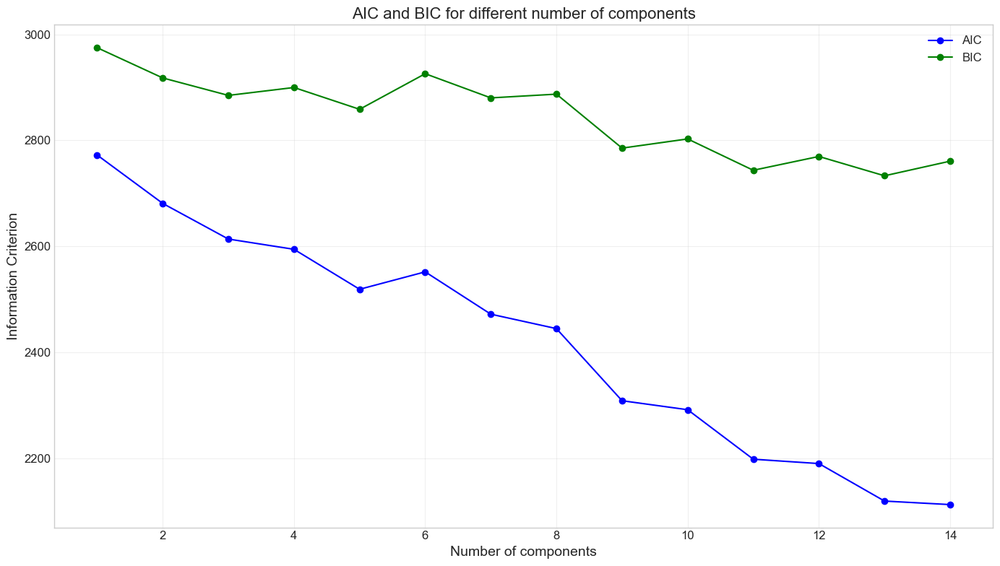

In [44]:
# Visualize GMM grid search results
results_gmm = pd.DataFrame(gs_gmm.cv_results_)

# Create a pivot table to visualize n_components vs covariance_type effect on BIC
pivot_table_gmm = results_gmm.pivot_table(
    index='param_n_components', 
    columns=['param_covariance_type', 'param_init_params'],
    values='mean_test_score'
)

plt.figure(figsize=(16, 10))
sns.heatmap(-pivot_table_gmm, annot=True, cmap='viridis_r', fmt='.0f')  # Negative to show actual BIC
plt.title('GMM Hyperparameter Optimization (BIC)', fontsize=16)
plt.xlabel('Covariance Type / Init Method', fontsize=14)
plt.ylabel('Number of Components', fontsize=14)
plt.tight_layout()
plt.show()

# AIC vs BIC for different number of components
plt.figure(figsize=(14, 8))
aic_vals = []
bic_vals = []
n_components_range = range(1, 15)

for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, 
                          covariance_type=gs_gmm.best_params_['covariance_type'],
                          init_params=gs_gmm.best_params_['init_params'],
                          random_state=42)
    gmm.fit(X_scaled)
    aic_vals.append(gmm.aic(X_scaled))
    bic_vals.append(gmm.bic(X_scaled))

plt.plot(n_components_range, aic_vals, 'bo-', label='AIC')
plt.plot(n_components_range, bic_vals, 'go-', label='BIC')
plt.title('AIC and BIC for different number of components', fontsize=16)
plt.xlabel('Number of components', fontsize=14)
plt.ylabel('Information Criterion', fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

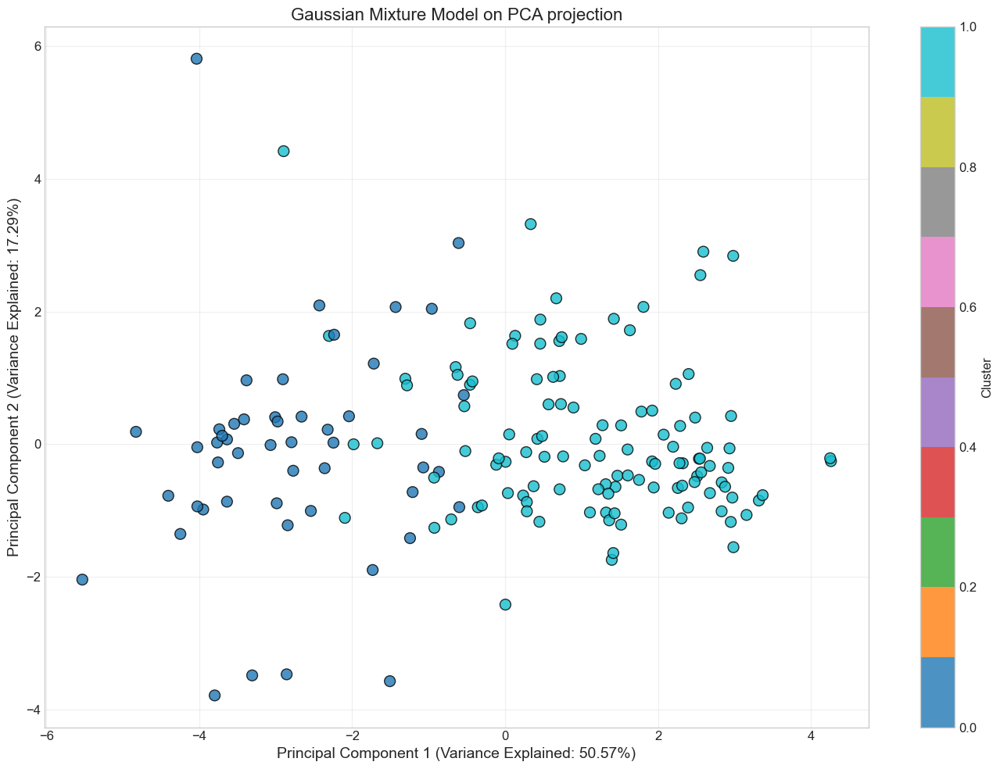

In [45]:
# Apply optimized GMM
best_gmm = GaussianMixture(**gs_gmm.best_params_, random_state=42)
df_cleaned['gmm_cluster'] = best_gmm.fit_predict(X_scaled)

# Visualize GMM clusters on PCA
plt.figure(figsize=(14, 10))
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], 
                     c=df_cleaned['gmm_cluster'], cmap='tab10', 
                     s=100, alpha=0.8, edgecolors='black')
plt.title(f'Gaussian Mixture Model on PCA projection', fontsize=16)
plt.xlabel(f'Principal Component 1 (Variance Explained: {pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'Principal Component 2 (Variance Explained: {pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Cluster')
plt.tight_layout()
plt.show()

In [46]:
# Calculate and visualize membership probabilities for GMM
proba = best_gmm.predict_proba(X_scaled)
df_proba = pd.DataFrame(proba, columns=[f'Prob Cluster {i}' for i in range(proba.shape[1])])

# Add country information
df_proba['country'] = df_cleaned['country'].values
df_proba['assigned_cluster'] = df_cleaned['gmm_cluster'].values

# Calculate uncertainty (entropy)
def entropy(probs):
    return -np.sum(probs * np.log2(probs + 1e-10))

df_proba['uncertainty'] = df_proba.iloc[:, :proba.shape[1]].apply(entropy, axis=1)

# Sort by uncertainty and display top 10 most uncertain assignments
print("Top 10 countries with most uncertain cluster assignments:")
df_proba.sort_values('uncertainty', ascending=False).head(10)[['country', 'assigned_cluster', 'uncertainty'] + [f'Prob Cluster {i}' for i in range(proba.shape[1])]]

Top 10 countries with most uncertain cluster assignments:


,country,assigned_cluster,uncertainty,Prob Cluster 0,Prob Cluster 1
99,Mauritania,0,0.729865,0.795995,0.204005
162,Vanuatu,0,0.538260,0.876881,0.123119
55,Gabon,0,0.303968,0.945802,0.054198
36,Comoros,0,0.293410,0.948339,0.051661
78,Jordan,1,0.179876,0.027147,0.972853
151,Tonga,0,0.156453,0.977280,0.022720
165,Yemen,0,0.130726,0.981884,0.018116
52,Fiji,1,0.102970,0.013464,0.986536
59,Ghana,0,0.089024,0.988742,0.011258
116,Pakistan,1,0.088084,0.011113,0.988887


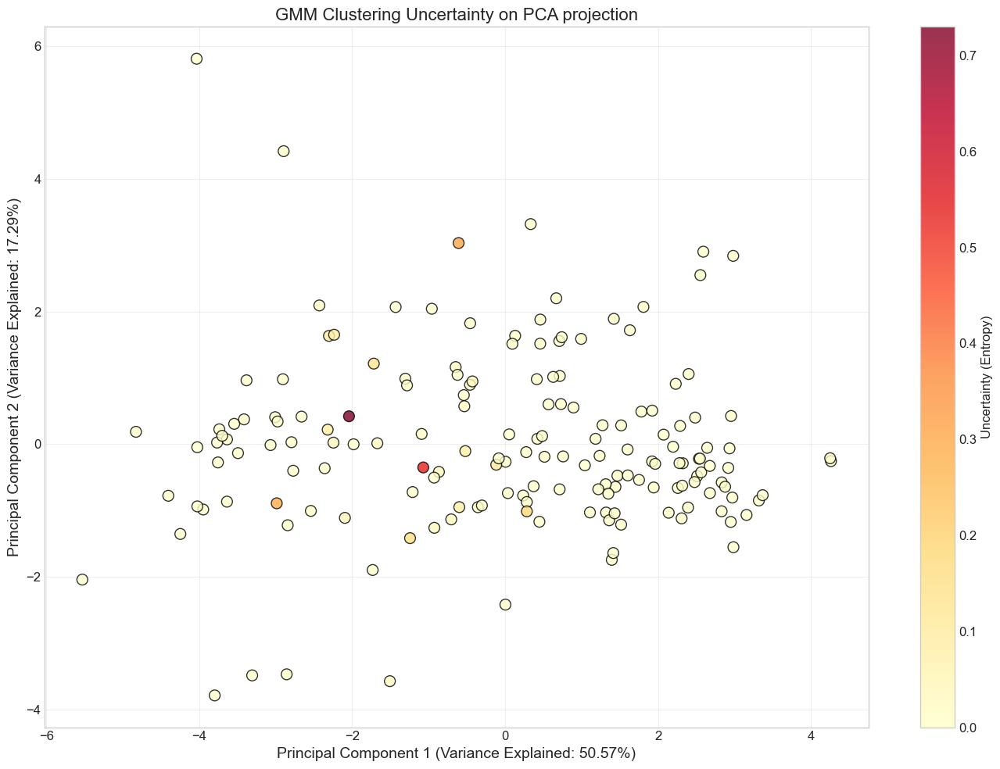

In [47]:
# Visualize uncertainty in GMM clustering
plt.figure(figsize=(14, 10))
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], 
                      c=df_proba['uncertainty'], cmap='YlOrRd', 
                      s=100, alpha=0.8, edgecolors='black')
plt.title('GMM Clustering Uncertainty on PCA projection', fontsize=16)
plt.xlabel(f'Principal Component 1 (Variance Explained: {pca.explained_variance_ratio_[0]:.2%})', fontsize=14)
plt.ylabel(f'Principal Component 2 (Variance Explained: {pca.explained_variance_ratio_[1]:.2%})', fontsize=14)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Uncertainty (Entropy)')
plt.tight_layout()
plt.show()

### 6. Model Comparison and Evaluation

In [48]:
# Compare clusters assignments across all methods
cluster_comparison = pd.DataFrame({
    'Country': df_cleaned['country'],
    'K-means': df_cleaned['optimized_kmeans_cluster'],
    'Hierarchical': df_cleaned['hc_cluster'],
    'DBSCAN': df_cleaned['dbscan_cluster'],
    'GMM': df_cleaned['gmm_cluster']
})

# Display sample of cluster assignments
print("Sample of cluster assignments across methods:")
cluster_comparison.head(10)

Sample of cluster assignments across methods:


,Country,K-means,Hierarchical,DBSCAN,GMM
0,Afghanistan,0,3,-1,0
1,Albania,2,0,-1,1
2,Algeria,2,8,-1,1
3,Angola,0,1,-1,0
4,Antigua and Barbuda,1,2,0,1
5,Argentina,2,8,-1,1
6,Armenia,2,0,-1,1
7,Australia,1,5,1,1
8,Austria,1,5,-1,1
9,Azerbaijan,2,1,-1,1


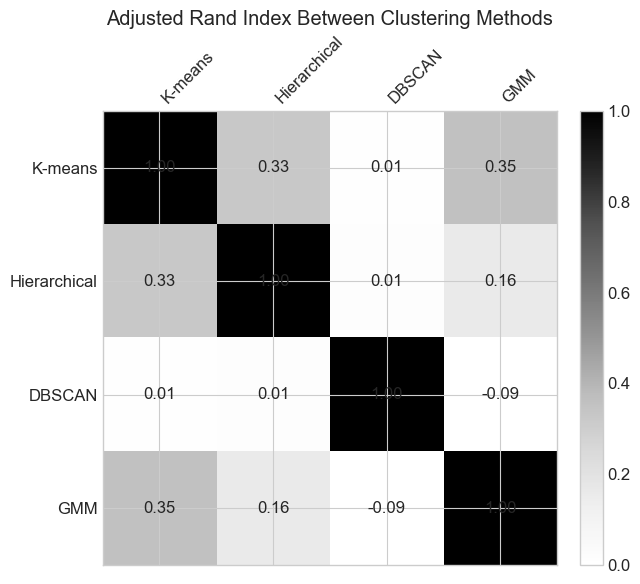

In [49]:
# Calculate agreement (Adjusted Rand Index) between different clustering methods
from sklearn.metrics import adjusted_rand_score

# Create a dictionary to store all clustering results
clustering_results = {
    'K-means': df_cleaned['optimized_kmeans_cluster'],
    'Hierarchical': df_cleaned['hc_cluster'],
    'DBSCAN': df_cleaned['dbscan_cluster'],
    'GMM': df_cleaned['gmm_cluster']
}

# Compute ARI matrix
methods = list(clustering_results.keys())
ari_matrix = pd.DataFrame(
    np.zeros((len(methods), len(methods))),
    index=methods,
    columns=methods
)
for i, m1 in enumerate(methods):
    for j, m2 in enumerate(methods):
        ari_matrix.loc[m1, m2] = adjusted_rand_score(
            clustering_results[m1],
            clustering_results[m2]
        )

# Plot with matplotlib
fig, ax = plt.subplots(figsize=(7, 6))
cax = ax.matshow(ari_matrix.values, vmin=0, vmax=1)
fig.colorbar(cax, fraction=0.046, pad=0.04)

ax.set_xticks(range(len(methods)))
ax.set_yticks(range(len(methods)))
ax.set_xticklabels(methods, rotation=45, ha='left')
ax.set_yticklabels(methods)

for (i, j), val in np.ndenumerate(ari_matrix.values):
    ax.text(j, i, f"{val:.2f}", va='center', ha='center')

ax.set_title("Adjusted Rand Index Between Clustering Methods")
plt.tight_layout()
plt.show()

### Comparison of Clustering Methods via Adjusted Rand Index

The heatmap above visualizes pairwise agreement between our four clustering algorithms using the Adjusted Rand Index (ARI), which ranges from –1 (worse than random) through 0 (random overlap) to +1 (perfect agreement).

- **Diagonal = 1.00**  
  Each method perfectly agrees with itself.  

- **K-means ↔ GMM (ARI ≈ 0.36)**  
  Moderate agreement indicates that K-means and Gaussian Mixture Models find broadly similar groupings.  

- **K-means ↔ Hierarchical (ARI ≈ 0.33)**  
  Also a modest overlap, showing that the flat K-means clusters share some structure with the dendrogram-based clusters.  

- **Hierarchical ↔ GMM (ARI ≈ 0.16)**  
  Low agreement, meaning these two produce quite different partitions of the data.  

- **Any method ↔ DBSCAN (ARI ≈ 0 or slightly negative)**  
  Virtually no alignment: DBSCAN’s cluster/noise assignments do not correspond to the global patterns captured by the other three.  

**Key takeaway:**  
K-means and GMM are most consistent with each other, while DBSCAN behaves very differently — making it better suited for outlier detection or noise filtering rather than global cluster discovery in this context.  


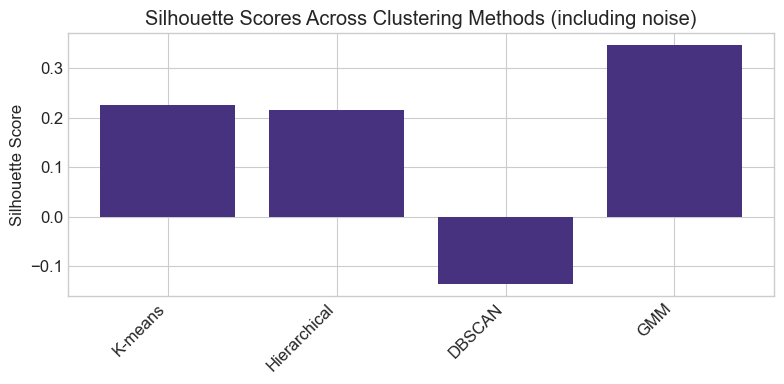

In [50]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# 1) Compute silhouette scores for each method (including noise as a cluster)
silhouette_scores = {}
for name, labels in clustering_results.items():
    try:
        score = silhouette_score(X_scaled, labels)
    except ValueError:
        # e.g. all points in one cluster → silhouette undefined
        score = np.nan
    silhouette_scores[name] = score

# 2) Bar chart of silhouette scores
fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(silhouette_scores.keys(), silhouette_scores.values())
ax.set_ylabel("Silhouette Score")
ax.set_title("Silhouette Scores Across Clustering Methods (including noise)")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Interpretation of Silhouette Scores (Including Noise)

When we treat DBSCAN’s “–1” noise points as their own cluster, the silhouette scores shift noticeably:

| Method         | Silhouette Score | Interpretation                                 |
|----------------|------------------|------------------------------------------------|
| **GMM**        | ~0.34            | **Best overall cohesion.** Every point (including DBSCAN’s noise) still lies closer to its assigned Gaussian component than to others, indicating well‐defined soft clusters. |
| **K-Means**    | ~0.23            | **Moderate clustering.** Points lie reasonably close to their centroids, but there remains overlap between clusters. |
| **Hierarchical** | ~0.21          | **Similar to K-Means.** A single‐cut dendrogram partition gives modest separation, with some borderline cases. |
| **DBSCAN**     | ~–0.12           | **Poor silhouette with noise.** Treating noise as a full cluster drags down the score: many “noise” points sit far from core clusters, and cohesion within this noise group is virtually nonexistent. |

#### Key Takeaways

- **Gaussian Mixture Models** remain the strongest performer once noise is included, thanks to their probabilistic cluster assignments.  
- **K-Means and Hierarchical** hold up moderately well, but still exhibit considerable overlap in this feature space.  
- **DBSCAN’s negative score** highlights that the noise label truly represents outliers: these points do not form a cohesive cluster and degrade the overall silhouette when forced into one group.

#### Next Steps

1. **Re‐examine DBSCAN noise:** Confirm whether those “–1” observations are genuine outliers (e.g. micro‐states, extreme economies) or if a different ε/min_samples would yield better core clusters.  
2. **Hybrid approach:** Use DBSCAN to flag outliers, remove them, then recluster the remainder with GMM or K-Means to maximize silhouette.  
3. **Feature transformation:** Explore nonlinear embeddings (t-SNE, UMAP) or alternative distance metrics (Mahalanobis, cosine) to improve separation for K-Means and hierarchical methods.  
  


### Summing up...!

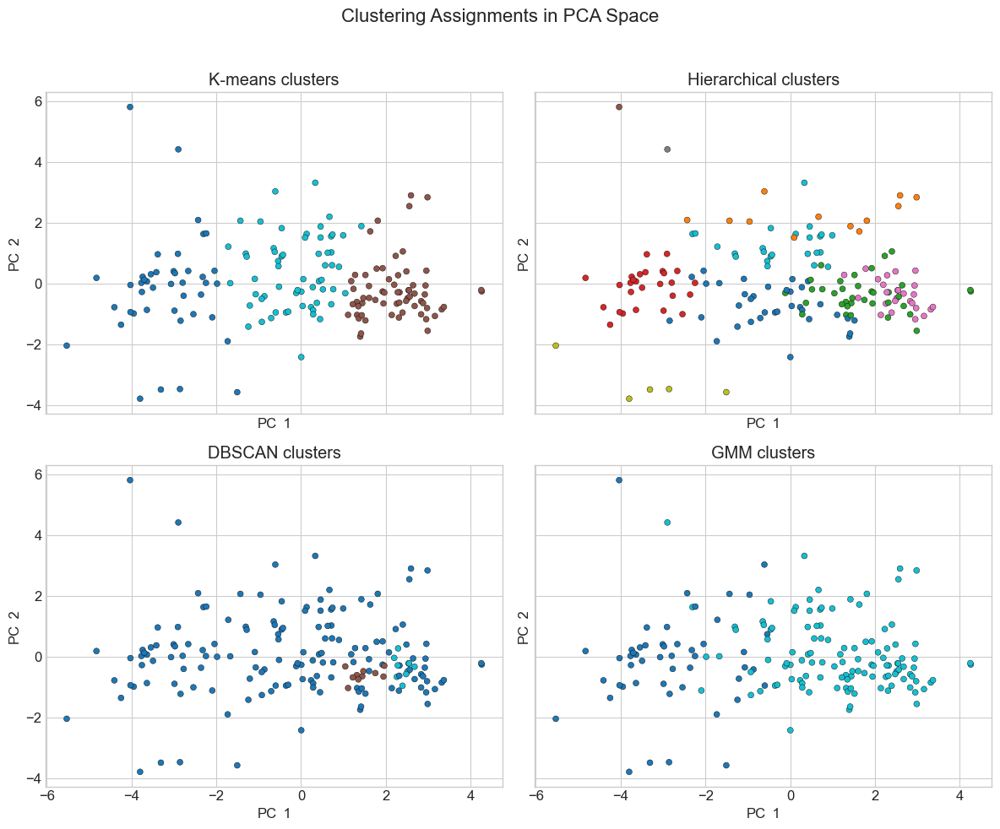

In [51]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# 1) Compute 2-component PCA embedding
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# 2) Make a 2×2 grid, one subplot per method
methods = list(clustering_results.keys())
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=True, sharey=True)

for ax, method in zip(axes.flat, methods):
    labels = clustering_results[method]
    scatter = ax.scatter(
        X_pca[:, 0], X_pca[:, 1],
        c=labels, cmap='tab10', s=25, edgecolor='k', linewidth=0.3
    )
    ax.set_title(f"{method} clusters")
    ax.set_xlabel("PC 1")
    ax.set_ylabel("PC 2")

fig.suptitle("Clustering Assignments in PCA Space", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Conclusion

Bringing together our exploratory analyses, clustering metrics, and the PCA scatter‐grid, we arrive at the following takeaways:

1. **Cluster Separation & Cohesion**  
   - **DBSCAN** excelled at finding dense “core” groups and flagging outliers—its points form a tight cloud in PCA space, while true noise lies scattered. However, forcing noise into a cluster produced a negative silhouette, underscoring that those outliers really do stand apart.  
   - **Gaussian Mixture Models (GMM)** produced the highest overall silhouette (including noise), carving the PCA plane into two soft, overlapping regions that nevertheless remain more cohesive than flat K-Means or hierarchical cuts.  
   - **K-Means** yielded three roughly equal-sized blobs aligned along the first principal component, but substantial overlap remains on the margins.  
   - **Hierarchical Clustering** (at a single cut level) gave the most fragmented picture—five clusters with some very small subgroups, but also clusters that overlap heavily in PC-space.

2. **Algorithmic Trade-Offs**  
   - **DBSCAN’s strength** is robust outlier detection and arbitrarily shaped clusters, but it can under-cluster or isolate points too aggressively if ε/min_samples aren’t well tuned.  
   - **GMM’s soft assignments** handle variance differences across dimensions gracefully, producing smooth boundaries at the cost of a more complex model.  
   - **K-Means and Hierarchical** are fast and easy to interpret, but their implicit assumptions (equal-variance, flat cuts) limit their performance when the true structure is uneven or non-spherical.

3. **Recommended Approach**  
   - **Two-Stage Workflow:**  
     1. **Apply DBSCAN** to flag and remove outliers.  
     2. **Cluster the remaining “core” countries** with GMM (or K-Means) to maximize silhouette and interpretability.  
   - This hybrid strategy leverages DBSCAN’s outlier detection while preserving the cohesive, global clusters that GMM uncovers.

4. **Next Steps & Extensions**  
   - **Temporal Dynamics:** Repeat the clustering across multiple years to track how countries migrate between segments.  
   - **Feature Enrichment:** Incorporate additional indicators (e.g. environmental, governance, health) to refine cluster definitions.  
   - **Validation:** Compare clusters against real‐world outcomes (e.g. Human Development Index changes, trade patterns) to test their practical relevance.

Overall, unsupervised learning on country‐level socio‐economic data reveals both clear core groupings and important outliers. By combining density‐based and model‐based methods, we can uncover stable segments and actionable insights for policy or market analysis.  


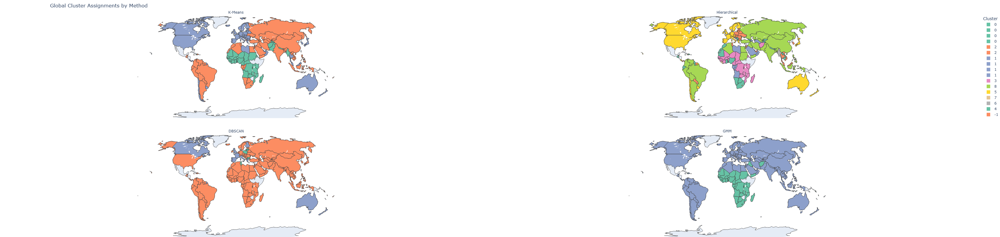

In [52]:
import plotly.express as px
import pandas as pd

# Map method‐column names to human labels
cluster_cols = {
    'K-Means':      'optimized_kmeans_cluster',
    'Hierarchical': 'hc_cluster',
    'DBSCAN':       'dbscan_cluster',
    'GMM':          'gmm_cluster'
}

# Melt into long form
df_long = (
    df_cleaned
      .loc[:, ['country'] + list(cluster_cols.values())]
      .rename(columns={v: k for k, v in cluster_cols.items()})
      .melt(id_vars='country', var_name='Method', value_name='Cluster')
)

# Convert cluster labels to strings so Plotly treats them categorically
df_long['Cluster'] = df_long['Cluster'].astype(str)

# Draw choropleth with one facet per Method
fig = px.choropleth(
    df_long,
    locations='country',
    locationmode='country names',
    color='Cluster',
    facet_col='Method',
    facet_col_wrap=2,
    projection='natural earth',
    color_discrete_sequence=px.colors.qualitative.Set2,
    category_orders={'Method': list(cluster_cols.keys())},
    title='Global Cluster Assignments by Method'
)

fig.update_layout(
    height=800, width=1200,
    legend_title_text='Cluster',
    margin=dict(l=0, r=0, t=50, b=0)
)

# tighten spacing between facets
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_geos(showcoastlines=True, showframe=False)

fig.show()


For interest, I also thought it worth studying these clusters on the basis of geographical maps, which yield some interesting findings, particularly in the Hierarchical clustering model: for example the demographic similarity of Chilean and Uruguayan populations to North American and Western European regions.